In [1]:
import statsmodels
from statsmodels.tsa.stattools import acf, ccf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics import utils
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.graphics.api import qqplot
import os

import sklearn
import torch


from torch.autograd import Variable
from sklearn.preprocessing import StandardScaler


ENSO_DIR = '../data/'

In [2]:
def mrse(actuals, preds):
    denom = np.sqrt(np.sum(np.square(actuals - np.mean(actuals))))
    num = np.sqrt(np.sum(np.square(actuals - preds)))
    return 1.0*num/denom

def re(actuals, preds):
    denom = np.sqrt(np.sum(np.square(actuals)))
    num = np.sqrt(np.sum(np.square(actuals - preds)))
    return 1.0*num/denom

In [4]:
filename = 'nino12_data.txt'
# First enso
data = open(ENSO_DIR + filename)
data_dict = {}

for line in data.readlines()[1:-3]:
    
    tokens = line.split(' ')
    values = []
    for token in tokens:
        if token == '':
            pass
        else:
            if '\n' in token:
                token = token[:-2]
            values.append(float(token))
    data_dict.update({values[0]:values[1:]})

filtered_data = {int(year): data_dict[year] for year in data_dict.keys() if year >= 1950 and year <=2008 }

In [5]:
filtered_ts = np.array([])
filtered_ts = np.array([np.concatenate((filtered_ts,val)) for val in filtered_data.values()]).flatten()

In [6]:
def get_data(data,years,subtract_mean=False,means=None):
    if subtract_mean == True:
        assert means is not None
    filtered_data = {int(year): data[year] for year in data.keys() if year in years }
    filtered_ts = np.array([])
    if subtract_mean:
        filtered_ts = np.array([np.concatenate((filtered_ts,val-means)) for val in filtered_data.values()]).flatten()
    else:
        filtered_ts = np.array([np.concatenate((filtered_ts,val)) for val in filtered_data.values()]).flatten()
    return filtered_ts

train_test_ratio = 0.8
years = np.array(list(filtered_data.keys()))
print('Total years available')
print(years)
print(f'Train Test ratio: {train_test_ratio}')
training_years = years[:int(train_test_ratio*len(years))]
print(f'No of years in training: {len(training_years)}')
print(training_years)
testing_years = years[int(train_test_ratio*len(years)):]
print(f'No of years in testing: {len(testing_years)}')
print(testing_years)

means = np.zeros(12)
for key,value in filtered_data.items():
    if int(key) in training_years:
        means += np.array(value)
means /= len(training_years)
print(means)

Total years available
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963
 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008]
Train Test ratio: 0.8
No of years in training: 47
[1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963
 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 1996]
No of years in testing: 12
[1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008]
[24.15851064 25.64957447 26.0287234  25.11765957 23.89361702 22.63170213
 21.53702128 20.61957447 20.34978723 20.6412766  21.34446809 22.44255319]


In [7]:
training_data = get_data(filtered_data,training_years,subtract_mean=False,means=means)

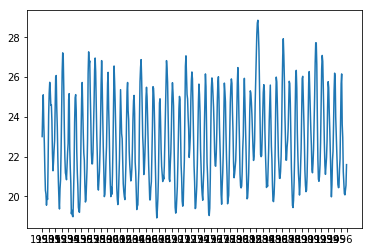

In [8]:
plt.plot(training_data)
plt.xticks(range(0,len(training_data)+1,12),training_years)
plt.show()

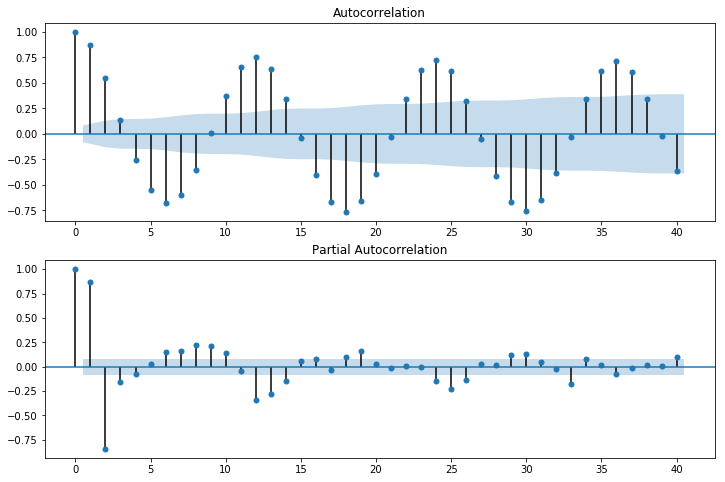

In [9]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(training_data, lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(training_data, lags=40, ax=ax2)
plt.show()

In [10]:
scaler = StandardScaler()
#scaled_training_data = scaler.fit_transform(training_data.reshape(-1, 1))
#scaled_test_data = scaler.transform(test_data.reshape(-1, 1))

#scaled_training_data = training_data - np.tile(means,int(len(training_data)/12))
scaled_training_data = scaler.fit_transform(training_data.reshape(-1, 1))
test_data = get_data(filtered_data,testing_years)
#test_anomalies = get_data(anomaly_data_dict,testing_years)
#scaled_test_data = test_data - np.tile(means,int(len(test_data)/12))
scaled_test_data = scaler.transform(test_data.reshape(-1, 1))

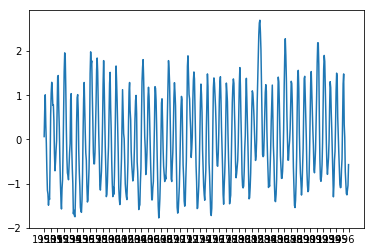

In [11]:
plt.plot(scaled_training_data)
#plt.plot(reqd_means)
plt.xticks(range(0,len(training_data)+1,12),training_years)
plt.show()

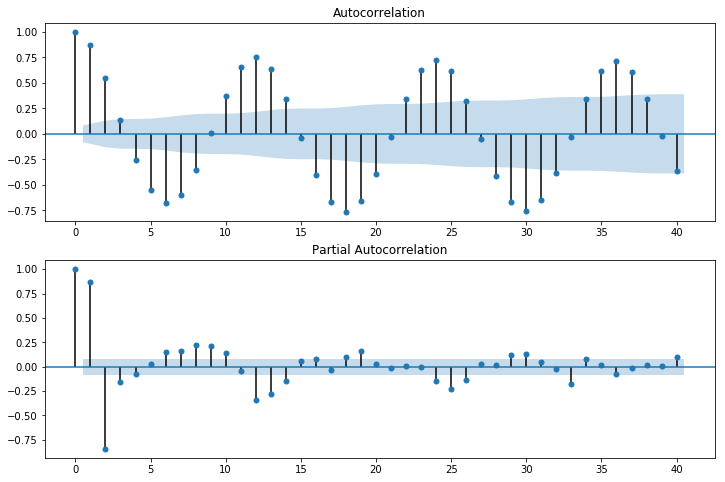

In [12]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(scaled_training_data, lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(scaled_training_data, lags=40, ax=ax2)
plt.show()

In [13]:
train_data_normalized = torch.FloatTensor(training_data).view(-1)
train_window = 6

def create_inout_sequences(input_data, tw):
    inout_seq = []
    L = len(input_data)
    for i in range(L-tw):
        train_seq = input_data[i:i+tw]
        train_label = input_data[i+tw:i+tw+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq

train_inout_seq = create_inout_sequences(train_data_normalized, train_window)

train_inout_seq[:5]

[(tensor([23.0100, 24.3200, 25.1100, 23.6300, 22.6800, 21.3300]),
  tensor([20.3100])),
 (tensor([24.3200, 25.1100, 23.6300, 22.6800, 21.3300, 20.3100]),
  tensor([20.1200])),
 (tensor([25.1100, 23.6300, 22.6800, 21.3300, 20.3100, 20.1200]),
  tensor([19.5600])),
 (tensor([23.6300, 22.6800, 21.3300, 20.3100, 20.1200, 19.5600]),
  tensor([19.9900])),
 (tensor([22.6800, 21.3300, 20.3100, 20.1200, 19.5600, 19.9900]),
  tensor([19.8500]))]

In [14]:
test_data_normalized = torch.FloatTensor(test_data).view(-1)

test_inout_seq = create_inout_sequences(test_data_normalized, train_window)

test_inout_seq[:5]

[(tensor([23.6600, 25.8800, 27.0300, 26.4400, 26.5400, 26.1200]),
  tensor([25.5900])),
 (tensor([25.8800, 27.0300, 26.4400, 26.5400, 26.1200, 25.5900]),
  tensor([24.9600])),
 (tensor([27.0300, 26.4400, 26.5400, 26.1200, 25.5900, 24.9600]),
  tensor([24.6900])),
 (tensor([26.4400, 26.5400, 26.1200, 25.5900, 24.9600, 24.6900]),
  tensor([24.6900])),
 (tensor([26.5400, 26.1200, 25.5900, 24.9600, 24.6900, 24.6900]),
  tensor([26.1200]))]

In [15]:
print(f'scaled_training_data: {len(scaled_training_data)}\n\
scaled_test_data: {len(scaled_test_data)}\n\
training_data: {len(training_data)}\n\
test_data: {len(test_data)}\n\
train_inout_seq: {len(train_inout_seq)}\n\
test_inout_seq: {len(test_inout_seq)}\n\
')

scaled_training_data: 564
scaled_test_data: 144
training_data: 564
test_data: 144
train_inout_seq: 558
test_inout_seq: 138



In [16]:
import torch.nn as nn
import torch.optim as optim
import sklearn
import torch
import torch.nn

from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.preprocessing import StandardScaler,MinMaxScaler
import seaborn as sns
class LSTM(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=10, num_hidden_layers=1, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size

        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_hidden_layers)

        self.linear = nn.Linear(hidden_layer_size, output_size)

    def forward(self, input_seq):
        #lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq) ,1, -1), self.hidden_cell)
        format_input = input_seq.view(len(input_seq) ,1, -1)
        lstm_out,_ = self.lstm(format_input)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

In [17]:
input_size=1
num_hidden_layers=1
hidden_layer_size=64
output_size=1

model = LSTM(input_size,hidden_layer_size,num_hidden_layers,output_size)
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, 'min', verbose=True, patience=4)
print(model)

LSTM(
  (lstm): LSTM(1, 64)
  (linear): Linear(in_features=64, out_features=1, bias=True)
)


In [18]:
epochs = 150

for i in range(epochs):
    for seq, labels in train_inout_seq:
        optimizer.zero_grad()
#         model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
#                         torch.zeros(1, 1, model.hidden_layer_size))

        y_pred = model(seq)

        single_loss = loss_function(y_pred, labels)
        single_loss.backward()
        optimizer.step()

    if i%25 == 1:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')


epoch:   1 loss: 2.35326838
epoch:  26 loss: 0.00186554
epoch:  51 loss: 0.00033948
epoch:  76 loss: 0.00285625
epoch: 101 loss: 0.01274938
epoch: 126 loss: 0.01900099
epoch: 149 loss: 0.0240719467


In [19]:
train_window = 12
fut_pred = 12

test_inputs = train_data_normalized[-train_window:].tolist()
print(test_inputs)

model.eval()

for i in range(fut_pred):
    seq = torch.FloatTensor(test_inputs[-train_window:])
    with torch.no_grad():
#         model.hidden = (torch.zeros(1, 1, model.hidden_layer_size),
#                         torch.zeros(1, 1, model.hidden_layer_size))
        test_inputs.append(model(seq).item())
        
print(test_inputs[fut_pred:])

actual_predictions = scaler.inverse_transform(np.array(test_inputs[train_window:] ).reshape(-1, 1))
print(actual_predictions)

[23.920000076293945, 25.65999984741211, 26.15999984741211, 23.6200008392334, 22.969999313354492, 21.239999771118164, 20.700000762939453, 20.139999389648438, 20.079999923706055, 20.309999465942383, 20.559999465942383, 21.600000381469727]
[22.968812942504883, 23.632638931274414, 23.145875930786133, 22.151044845581055, 21.38469123840332, 21.03862190246582, 21.045839309692383, 21.227806091308594, 21.29501724243164, 21.3312931060791, 21.591894149780273, 22.07840919494629]
[[73.85655169]
 [75.33018511]
 [74.24961545]
 [72.04118076]
 [70.33994533]
 [69.57170282]
 [69.58772481]
 [69.99167455]
 [70.1408772 ]
 [70.22140632]
 [70.79991698]
 [71.87993621]]


In [20]:
def evaluate(rescale=True, display_plots=True):
    model.eval()
    scaled_predictions = []
    scaled_actuals = []
    for i in range(len(test_inout_seq)):
        seq = torch.FloatTensor(test_inout_seq[i][0])
        scaled_actuals.append(test_inout_seq[i][1].item())
        with torch.no_grad():
#             model.hidden = (torch.zeros(1, 1, model.hidden_layer_size),
#                             torch.zeros(1, 1, model.hidden_layer_size))
            scaled_predictions.append(model(seq).item())
    if rescale:
        actuals = scaler.inverse_transform(np.array(scaled_actuals).reshape(-1, 1))
        predictions = scaler.inverse_transform(np.array(scaled_predictions).reshape(-1, 1))
    else:
        actuals=scaled_actuals
        predictions=scaled_predictions
    a1 = actuals
    p1 = predictions
    #actuals = test_data
    if display_plots:
        plt.plot(actuals,label='Truth')
        plt.plot(predictions,label='Preds')
        plt.xticks(range(0,len(scaled_test_data)+1,12),testing_years)
        plt.legend()
        plt.show()
    actuals = np.array(actuals)
    predictions = np.array(predictions)
    test_mrse = mrse(actuals,predictions)
    test_re = re(actuals,predictions)
    test_error = error(actuals,predictions)
    print(f'Test MRSE: {test_mrse}\nTest RE: {test_re}\nTest ERROR: {test_error}')
    return test_mrse,test_re,test_error,a1,p1
    

In [22]:
layers = [1]
sizes = [8,32,64,128]
epochs = 100
p=6
loss_function = nn.MSELoss()
input_size=1
output_size=1
skip_cnt = 0
lr_threshold = 1e-5
best_test_metric = np.inf
best_path = None
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
def error(actuals, preds):
    actuals = np.array(actuals)
    preds = np.array(preds)
    return np.sqrt(np.mean(np.square(actuals-preds)))


for a,l in enumerate(layers):
    for b,s in enumerate(sizes):
        if (a*len(sizes))+(b)<skip_cnt:
            print(f'Skipping num_hidden_layers: {l} hidden_layer_size: {s}')
        else:
            num_hidden_layers=l
            hidden_layer_size=s
            prev_running_loss = np.inf
            model = LSTM(input_size,hidden_layer_size,num_hidden_layers,output_size)
            print(model)
            optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
            scheduler = ReduceLROnPlateau(optimizer, 'min', verbose=True, patience=4)
            #best_model_params = model.state_dict()
            #PATH = f'models/best_rnn_model_{p}_{l}_{s}.pth'

            for i in range(epochs):
                running_loss = 0.0
                cnt=0
                for seq, labels in train_inout_seq:
                    optimizer.zero_grad()
            #         model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
            #                         torch.zeros(1, 1, model.hidden_layer_size))

                    y_pred = model(seq)
                    single_loss = loss_function(y_pred, labels)
                    single_loss.backward()
                    optimizer.step()
                    current_loss = single_loss.item()
                    running_loss += current_loss
                current_lr = get_lr(optimizer)
                if current_lr < lr_threshold:
                    print('LR lower than threshold {lr_threshold}. stopping training')
                    break
                    
#                 if running_loss > prev_running_loss:
#                     print('Training loss started to increase. stopping training...')
#                     prev_running_loss = running_loss
#                     cnt += 1
#                     if cnt > 4:   
#                         break
#                 else:
#                     cnt=0
                prev_running_loss = running_loss
                test_mrse,test_re,test_error,_,_ = evaluate(False,False)
                
                if i%5 == 1:
                    print(f'epoch: {i:3} loss: {running_loss:10.8f}')
                test_metric = test_error 
                scheduler.step(test_metric)
                if(test_metric < best_test_metric):
                    count = 0
                    best_test_metric = test_metric
                    #best_path = PATH
                    #torch.save({
                    #    'state_dict': model.state_dict(),
                    #    }, PATH)
                    #print(f"Best Model saved at epoch: {i} with metric: {best_test_metric} num_hidden_layers: {l} hidden_layer_size: {s}")
                else:
                    count+=1
            #     if(count >= 5):
            #         print("Validation has not improved since 5 epochs. Early Stopping...")
            #         break
            print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')

LSTM(
  (lstm): LSTM(1, 8)
  (linear): Linear(in_features=8, out_features=1, bias=True)
)
Test MRSE: 7.729834532055196
Test RE: 0.7617767940282054
Test ERROR: 17.765776178515594
Test MRSE: 5.101081500443116
Test RE: 0.5027126383326309
Test ERROR: 11.724011921526056
epoch:   1 loss: 108297.42149353
Test MRSE: 3.5555127468346797
Test RE: 0.3503965175681461
Test ERROR: 8.171771775731596
Test MRSE: 2.389911226783425
Test RE: 0.23552624636416902
Test ERROR: 5.4928249454089055
Test MRSE: 1.6055313241229974
Test RE: 0.15822544450729562
Test ERROR: 3.690054429196321
Test MRSE: 1.1955248399096259
Test RE: 0.11781922057331501
Test ERROR: 2.747720747916579
Test MRSE: 1.0504515932067322
Test RE: 0.10352222206522274
Test ERROR: 2.4142933220478744
epoch:   6 loss: 3113.96023433
Test MRSE: 1.0145910215520344
Test RE: 0.0999881553017171
Test ERROR: 2.3318735901624112
Test MRSE: 1.0067189641370908
Test RE: 0.09921236241312506
Test ERROR: 2.3137809376588754
Test MRSE: 0.9765782277640958
Test RE: 0.09624

In [23]:
# 1 layer, 128 hidden units is best



LSTM(
  (lstm): LSTM(1, 128)
  (linear): Linear(in_features=128, out_features=1, bias=True)
)


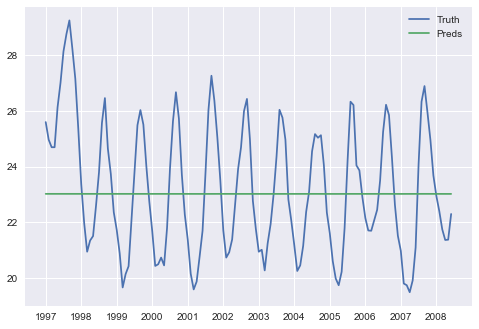

Test MRSE: 1.0029699441106603
Test RE: 0.09884289571307624
Test ERROR: 2.305164420655551


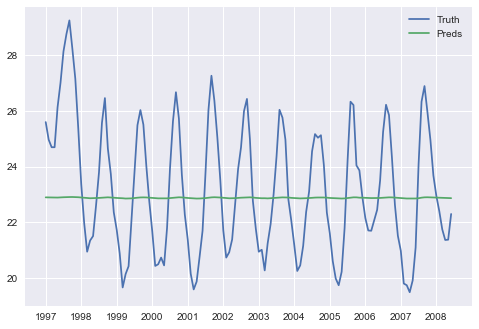

Test MRSE: 1.0049291765679638
Test RE: 0.09903597847751205
Test ERROR: 2.309667400010903
epoch:   1 loss: 2891.76642177


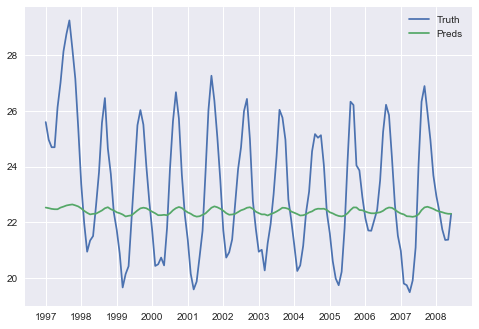

Test MRSE: 1.022219499556311
Test RE: 0.1007399433889412
Test ERROR: 2.349406414732548


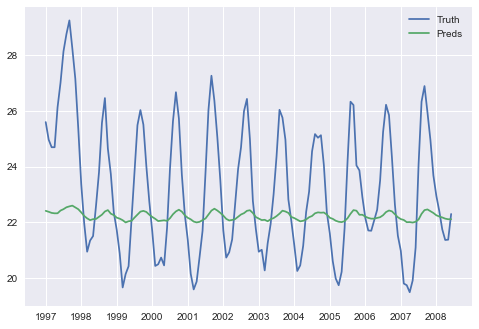

Test MRSE: 1.0345780814920014
Test RE: 0.10195788419823844
Test ERROR: 2.37781061920068


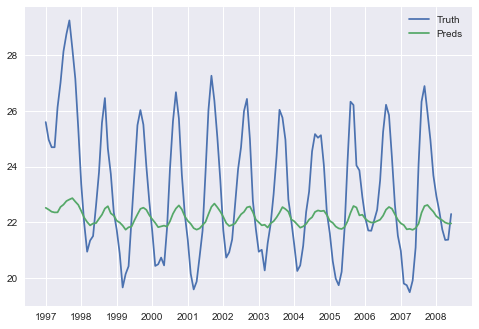

Test MRSE: 0.997522182853113
Test RE: 0.09830601771288158
Test ERROR: 2.292643621306714


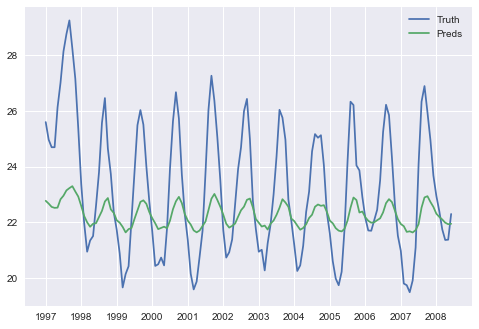

Test MRSE: 0.933786831854245
Test RE: 0.09202488567197732
Test ERROR: 2.1461582113267976


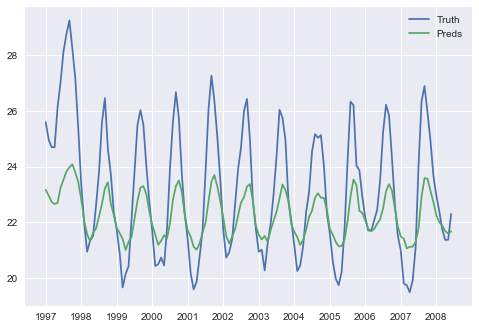

Test MRSE: 0.7994035059770598
Test RE: 0.07878138107520405
Test ERROR: 1.8372998418807143
epoch:   6 loss: 2097.08716426


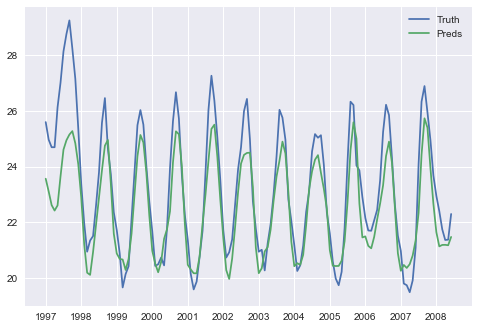

Test MRSE: 0.520989870465519
Test RE: 0.05134365963444134
Test ERROR: 1.1974110689667414


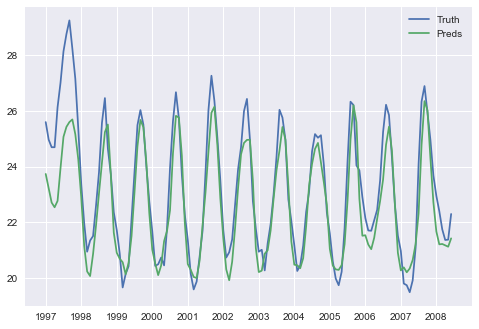

Test MRSE: 0.45746683345808936
Test RE: 0.04508345118136481
Test ERROR: 1.0514136284039994


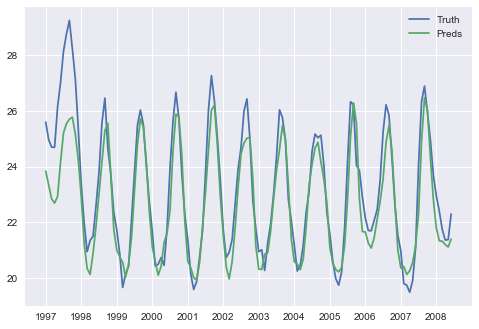

Test MRSE: 0.4373972411334393
Test RE: 0.04310558870124001
Test ERROR: 1.0052869120098533


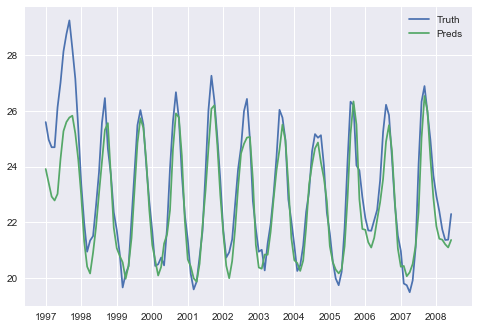

Test MRSE: 0.4250829698012772
Test RE: 0.041892014711097464
Test ERROR: 0.9769845483070515


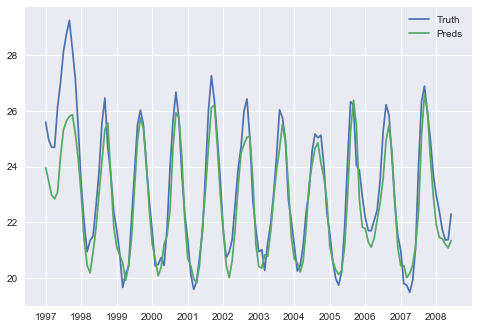

Test MRSE: 0.4168800099587954
Test RE: 0.04108361131973968
Test ERROR: 0.9581313700199171
epoch:  11 loss: 376.82776769


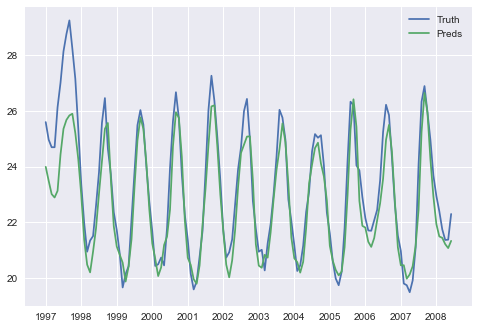

Test MRSE: 0.41009319211682677
Test RE: 0.04041476901582381
Test ERROR: 0.942532965391104


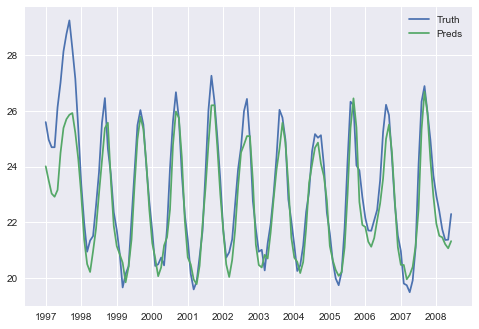

Test MRSE: 0.4054700664463903
Test RE: 0.03995915902352579
Test ERROR: 0.931907457747244


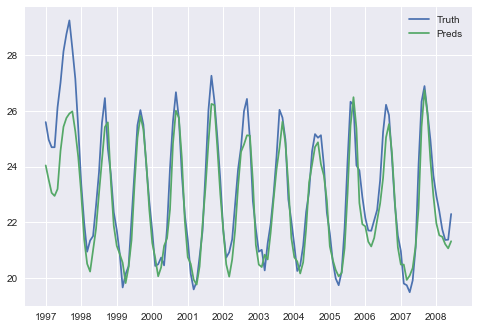

Test MRSE: 0.39850398240089174
Test RE: 0.03927264999812496
Test ERROR: 0.9158970387040112


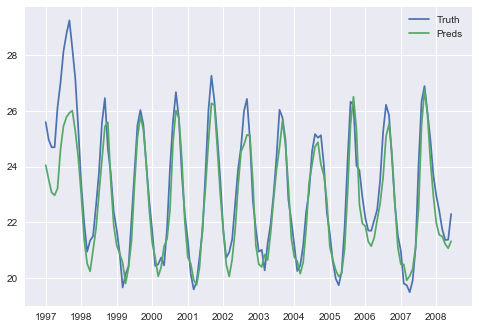

Test MRSE: 0.3956753753268615
Test RE: 0.03899389018515813
Test ERROR: 0.9093959422101867


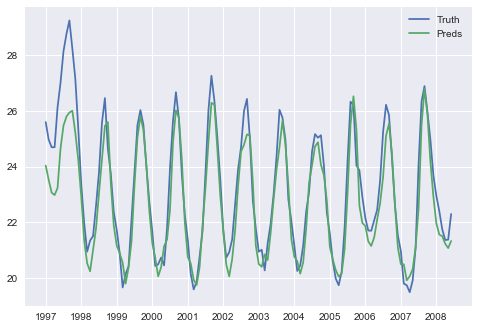

Test MRSE: 0.3952701038940813
Test RE: 0.03895395060152354
Test ERROR: 0.9084644912798386
epoch:  16 loss: 332.42543524


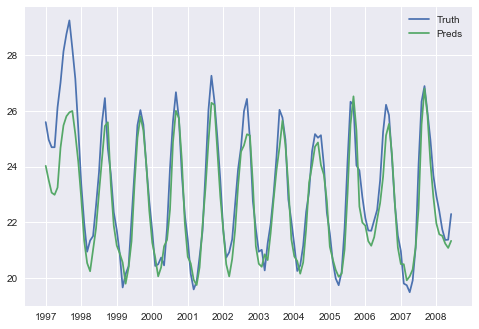

Test MRSE: 0.39550957749069066
Test RE: 0.03897755077406578
Test ERROR: 0.9090148826627827


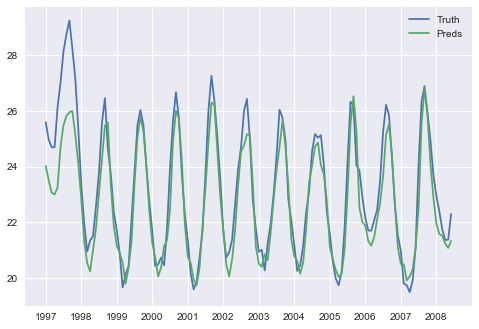

Test MRSE: 0.395077954560181
Test RE: 0.03893501424487242
Test ERROR: 0.908022867071097


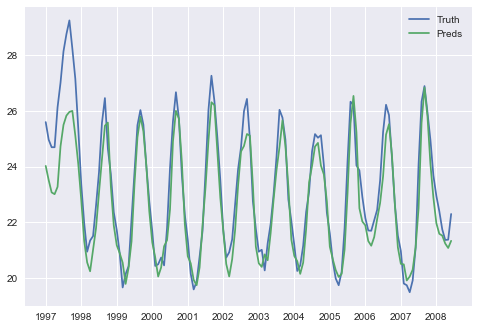

Test MRSE: 0.3939428294670332
Test RE: 0.03882314743185162
Test ERROR: 0.9054139653855755


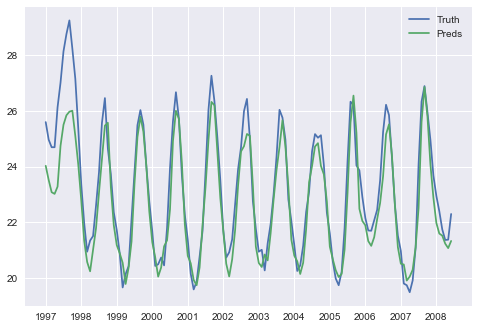

Test MRSE: 0.3930513714634984
Test RE: 0.03873529406097707
Test ERROR: 0.9033650931493499


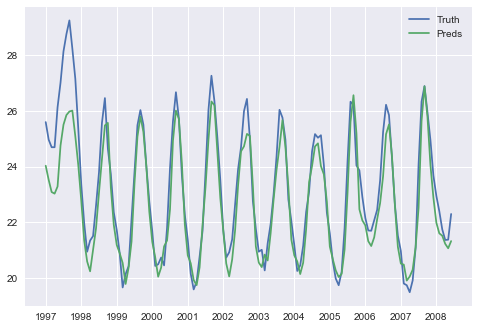

Test MRSE: 0.3921216059981673
Test RE: 0.0386436654818088
Test ERROR: 0.9012281773994608
epoch:  21 loss: 312.44727608


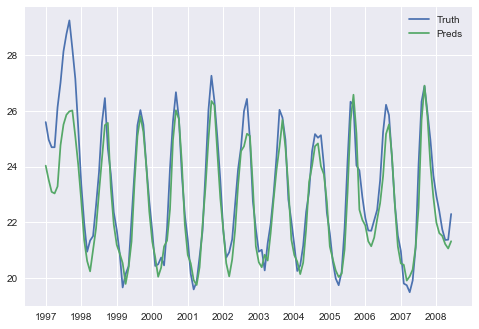

Test MRSE: 0.3910250281005142
Test RE: 0.038535597502887355
Test ERROR: 0.8987078702167878


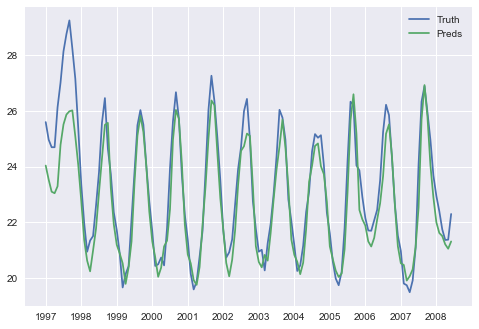

Test MRSE: 0.38979997471377664
Test RE: 0.038414868237908614
Test ERROR: 0.8958922828733257


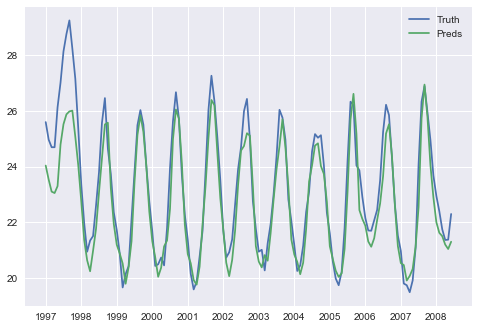

Test MRSE: 0.3887092854854273
Test RE: 0.038307380588566635
Test ERROR: 0.893385509845932


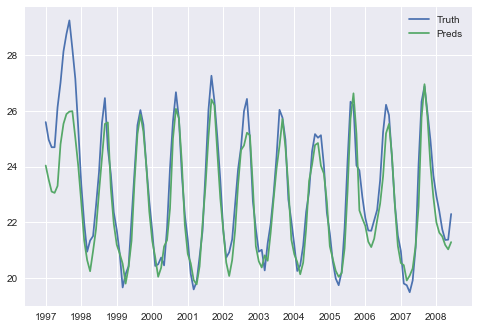

Test MRSE: 0.3879151939998854
Test RE: 0.038229122708205464
Test ERROR: 0.8915604188250441


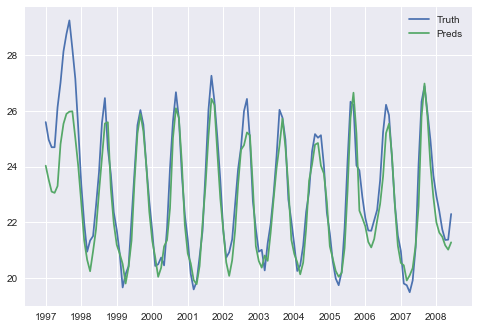

Test MRSE: 0.3873637019145112
Test RE: 0.03817477304897459
Test ERROR: 0.8902929033417113
epoch:  26 loss: 313.57409532


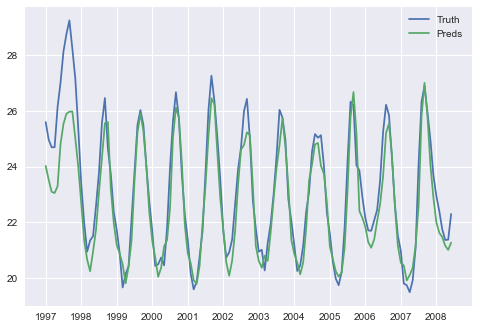

Test MRSE: 0.3877029457461965
Test RE: 0.038208205598846565
Test ERROR: 0.8910726004954692


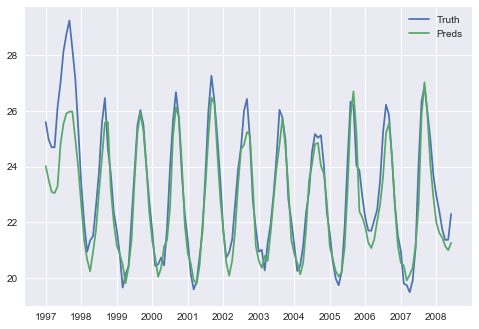

Test MRSE: 0.38803404615740583
Test RE: 0.038240835612944085
Test ERROR: 0.8918335813125573


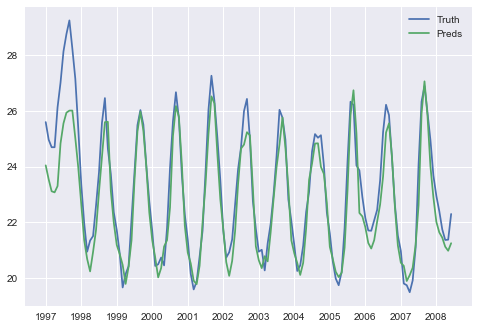

Test MRSE: 0.3847830533135264
Test RE: 0.03792044959488004
Test ERROR: 0.8843616993488743


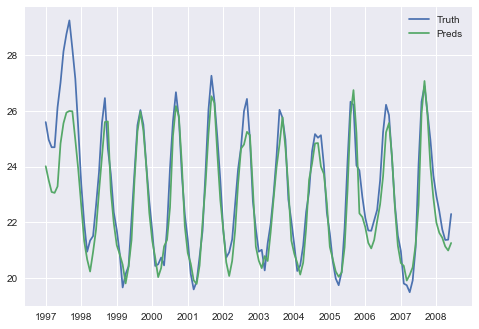

Test MRSE: 0.38718818819462825
Test RE: 0.0381574761355302
Test ERROR: 0.8898895134048675


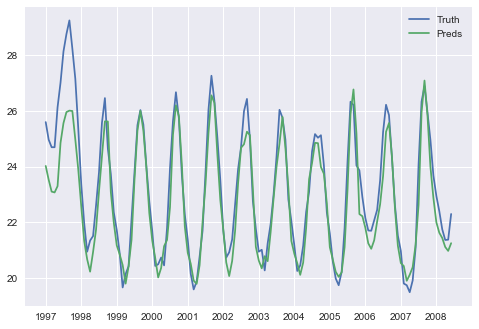

Test MRSE: 0.3851186455861099
Test RE: 0.037953522282846285
Test ERROR: 0.8851330039838227
epoch:  31 loss: 311.91809065


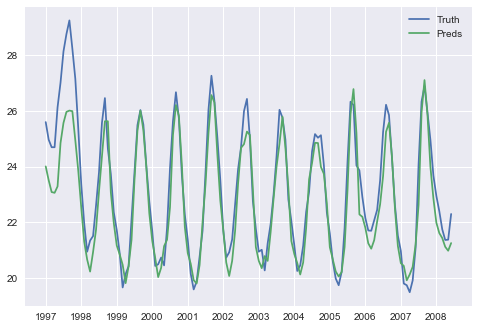

Test MRSE: 0.3866127838669797
Test RE: 0.03810076991987082
Test ERROR: 0.8885670394948814


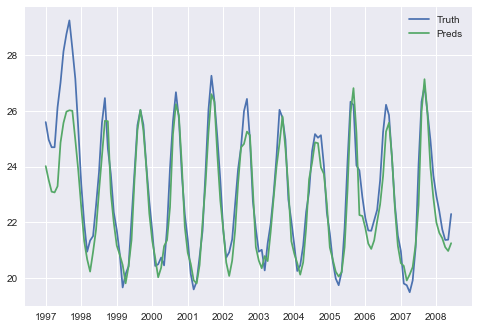

Test MRSE: 0.3854023417300696
Test RE: 0.037981480596588645
Test ERROR: 0.885785033749194


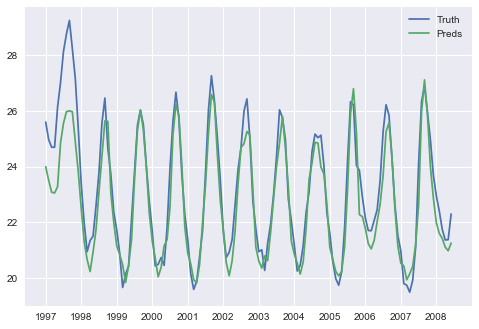

Test MRSE: 0.3879490167544297
Test RE: 0.038232455947670704
Test ERROR: 0.8916381549634419
Epoch    34: reducing learning rate of group 0 to 1.0000e-04.


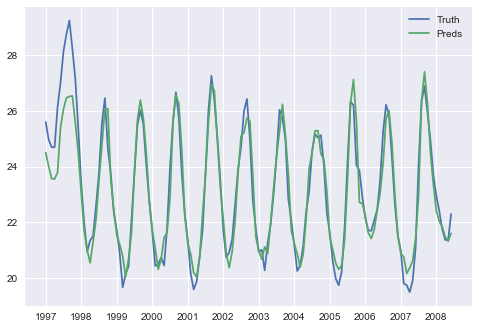

Test MRSE: 0.3091987401313642
Test RE: 0.030471599876822433
Test ERROR: 0.710643363589869


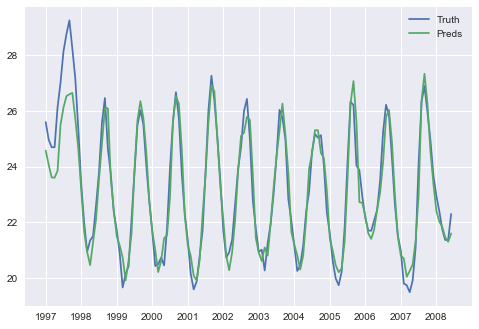

Test MRSE: 0.30018643456997285
Test RE: 0.029583435297245855
Test ERROR: 0.6899300348902568
epoch:  36 loss: 225.81314453


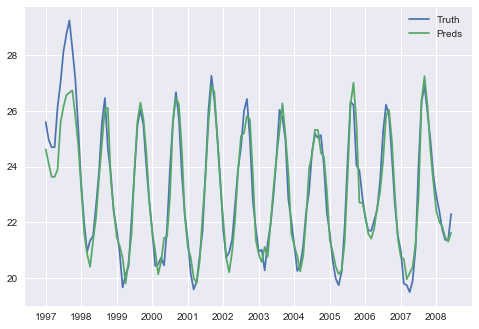

Test MRSE: 0.29403403301721703
Test RE: 0.028977114850023248
Test ERROR: 0.6757897336336982


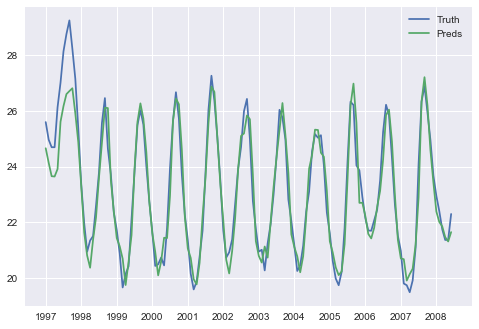

Test MRSE: 0.2905794897177761
Test RE: 0.02863666889240712
Test ERROR: 0.6678500238246007


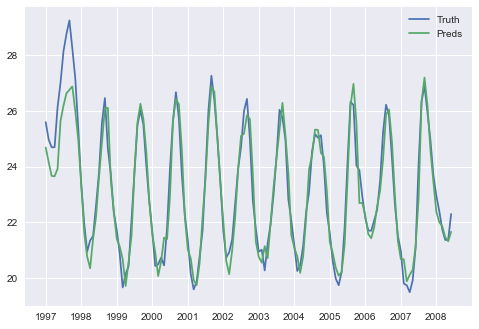

Test MRSE: 0.28840068373703137
Test RE: 0.0284219471117612
Test ERROR: 0.662842390190297


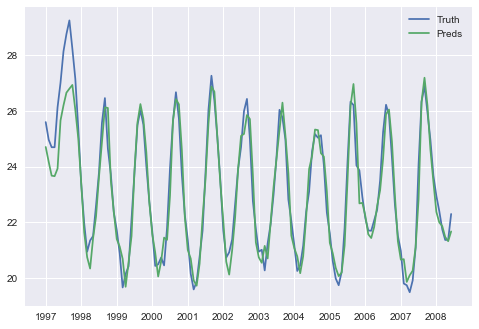

Test MRSE: 0.286815129946293
Test RE: 0.02826569045730643
Test ERROR: 0.6591982508948901


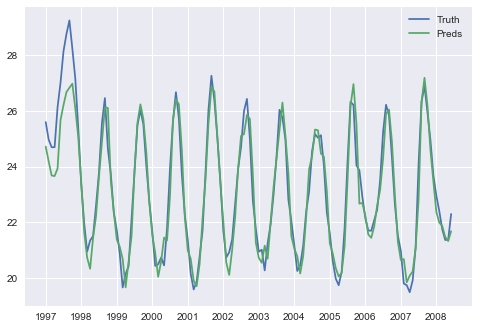

Test MRSE: 0.2855770419802232
Test RE: 0.028143676631834955
Test ERROR: 0.6563527056761285
epoch:  41 loss: 192.51742685


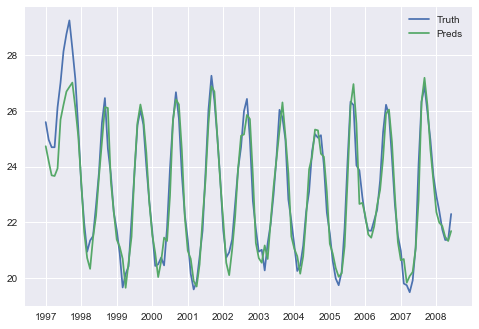

Test MRSE: 0.28452951597040327
Test RE: 0.028040442726618403
Test ERROR: 0.6539451363349659


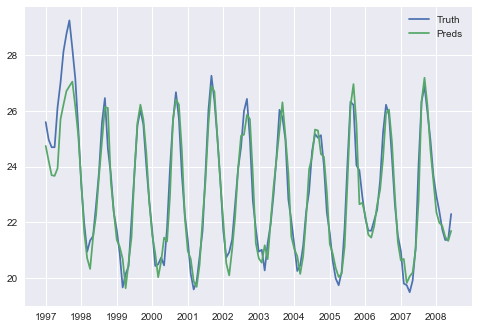

Test MRSE: 0.2835650240521528
Test RE: 0.02794539184832287
Test ERROR: 0.6517284074419258


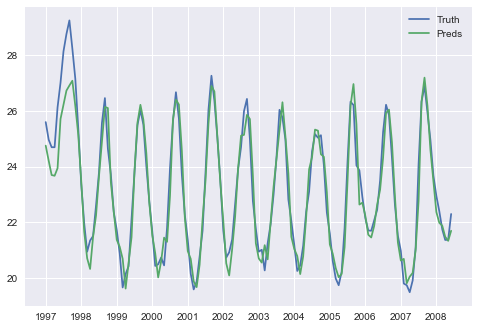

Test MRSE: 0.28263663016453544
Test RE: 0.027853898438422352
Test ERROR: 0.6495946440418798


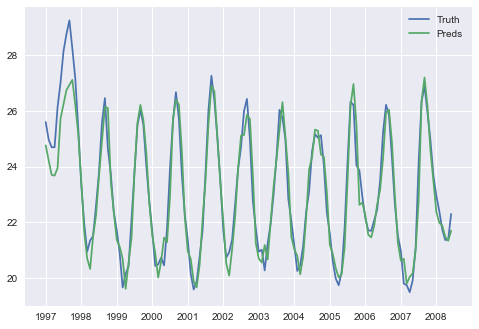

Test MRSE: 0.2817517150501484
Test RE: 0.02776668987062839
Test ERROR: 0.647560809579578


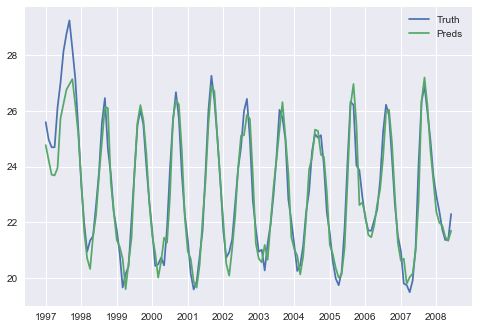

Test MRSE: 0.2809457645032063
Test RE: 0.027687263277310147
Test ERROR: 0.645708462421492
epoch:  46 loss: 184.07622383


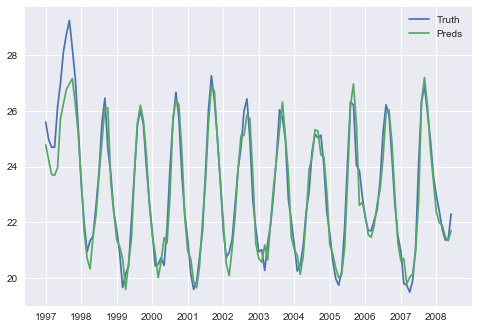

Test MRSE: 0.2802394699235032
Test RE: 0.027617657800202648
Test ERROR: 0.6440851584080531


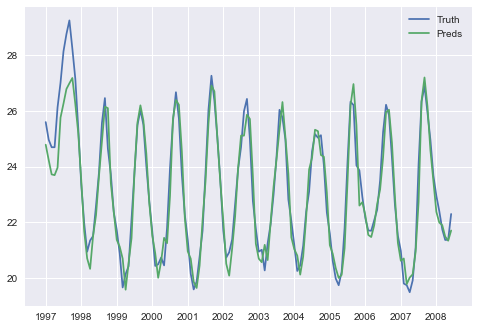

Test MRSE: 0.27962631873669364
Test RE: 0.027557231623755354
Test ERROR: 0.6426759294390143


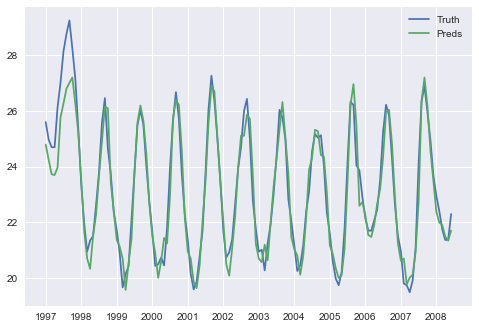

Test MRSE: 0.27908963742907006
Test RE: 0.027504341569739195
Test ERROR: 0.6414424541361607


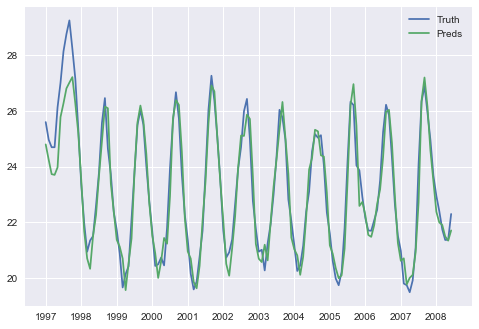

Test MRSE: 0.2786133052756995
Test RE: 0.02745739893737334
Test ERROR: 0.6403476816169926


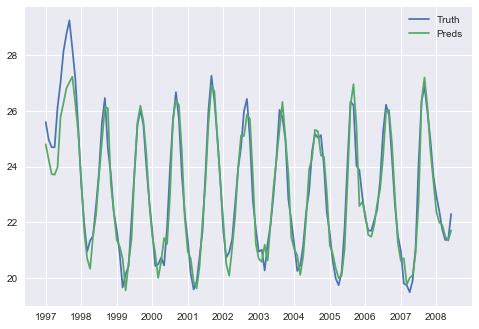

Test MRSE: 0.27818702219421815
Test RE: 0.02741538865140762
Test ERROR: 0.6393679388058263
epoch:  51 loss: 179.91268266


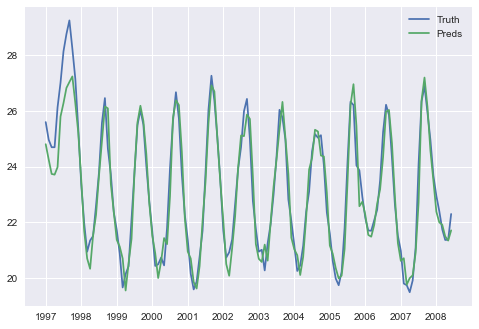

Test MRSE: 0.27780163931113844
Test RE: 0.027377409088465057
Test ERROR: 0.6384821984946422


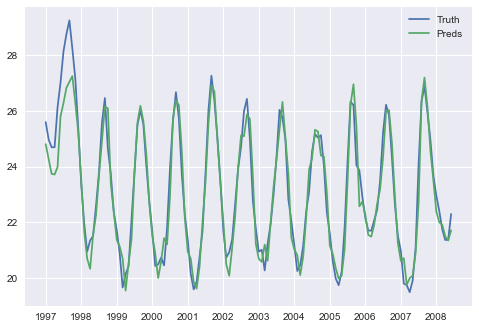

Test MRSE: 0.2774503919665062
Test RE: 0.027342793589906163
Test ERROR: 0.6376749132051375


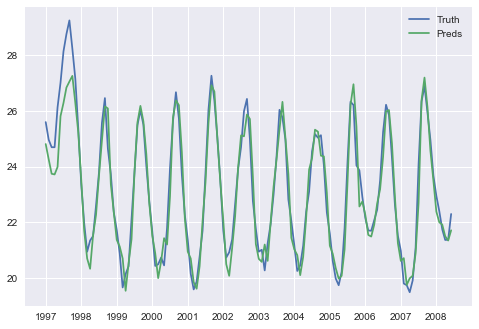

Test MRSE: 0.2771279813315177
Test RE: 0.027311019955054902
Test ERROR: 0.6369339044351532


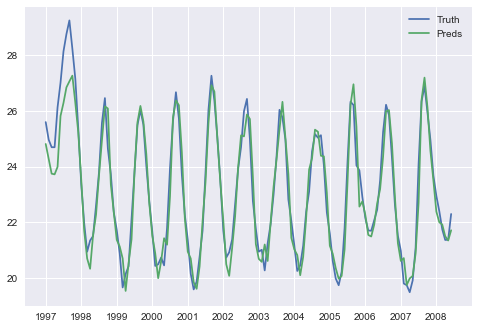

Test MRSE: 0.2768296421581271
Test RE: 0.027281618567729465
Test ERROR: 0.6362482200317212


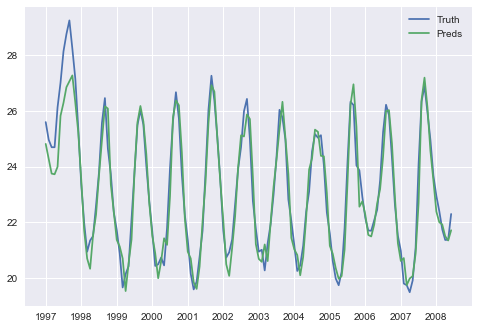

Test MRSE: 0.2765515662514249
Test RE: 0.027254214129532807
Test ERROR: 0.6356091074739268
epoch:  56 loss: 177.38460599


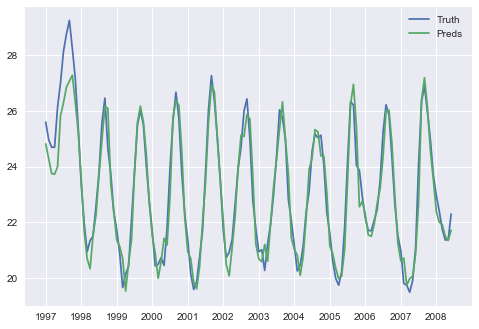

Test MRSE: 0.2762906190585174
Test RE: 0.027228497729628074
Test ERROR: 0.6350093624982249


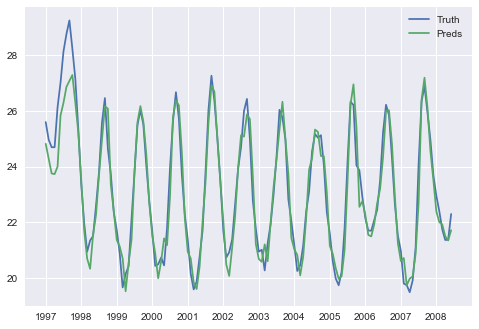

Test MRSE: 0.2760442123535053
Test RE: 0.027204214297816852
Test ERROR: 0.6344430364854265


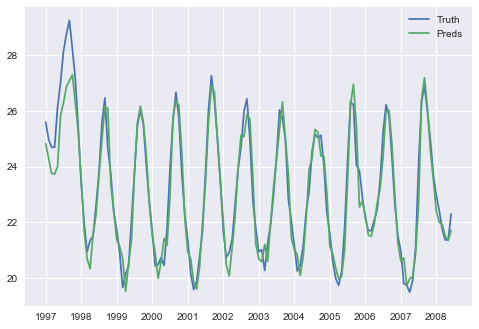

Test MRSE: 0.27580982811814525
Test RE: 0.02718111568287977
Test ERROR: 0.6339043421772999


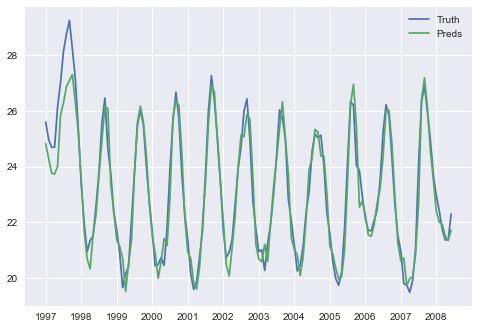

Test MRSE: 0.27558500631335897
Test RE: 0.027158959447456162
Test ERROR: 0.6333876255713595


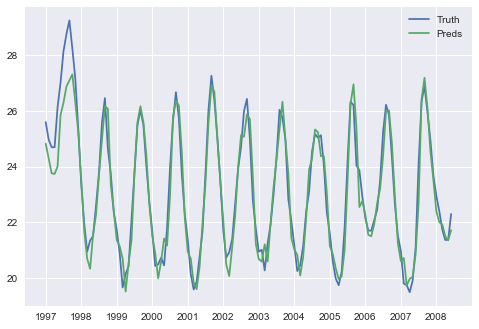

Test MRSE: 0.2753688495379903
Test RE: 0.027137657152476242
Test ERROR: 0.6328908241359933
epoch:  61 loss: 175.52666826


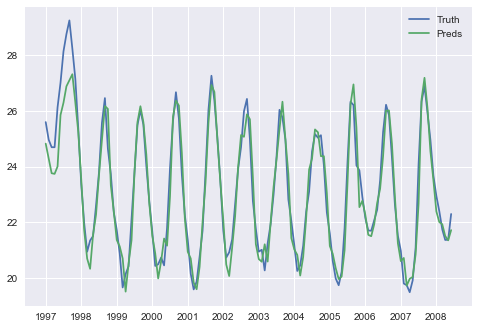

Test MRSE: 0.27515927847041194
Test RE: 0.027117003880362995
Test ERROR: 0.6324091588862846


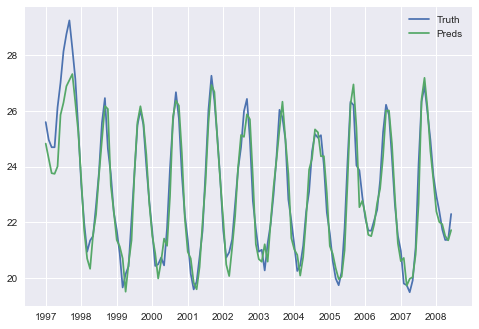

Test MRSE: 0.2749555540487936
Test RE: 0.027096926796419986
Test ERROR: 0.631940931207987


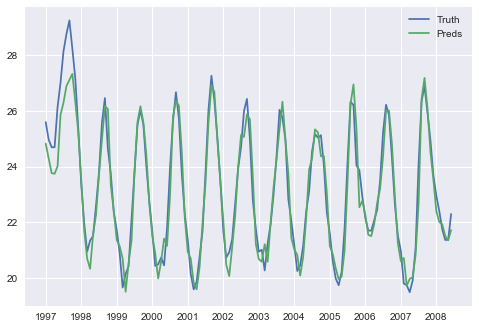

Test MRSE: 0.2747572160763078
Test RE: 0.02707738054815455
Test ERROR: 0.6314850834130218


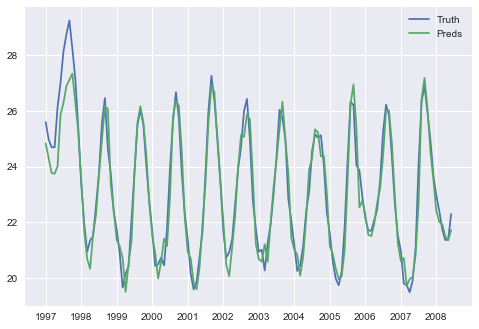

Test MRSE: 0.27456568925437796
Test RE: 0.02705850554018703
Test ERROR: 0.6310448899474982


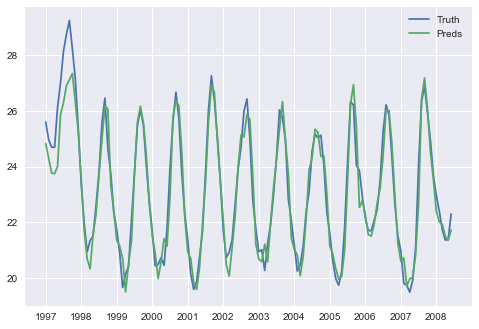

Test MRSE: 0.27438451709809897
Test RE: 0.027040650986663917
Test ERROR: 0.6306284950085271
epoch:  66 loss: 173.93156446


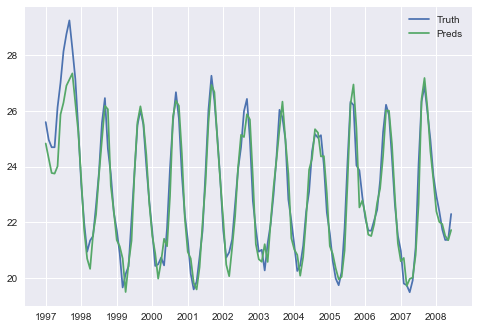

Test MRSE: 0.2742191962603769
Test RE: 0.02702435858386749
Test ERROR: 0.6302485317650146


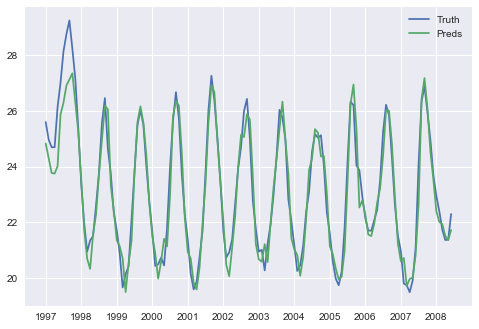

Test MRSE: 0.27407314132610316
Test RE: 0.027009964839845982
Test ERROR: 0.6299128480888229


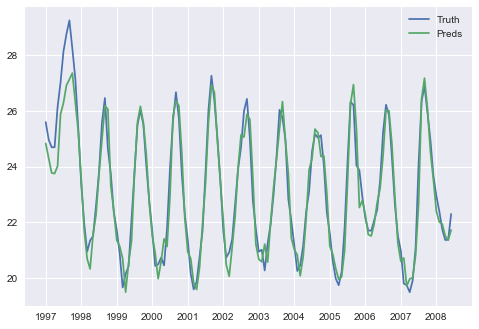

Test MRSE: 0.27394088146099366
Test RE: 0.026996930602747642
Test ERROR: 0.629608870150978


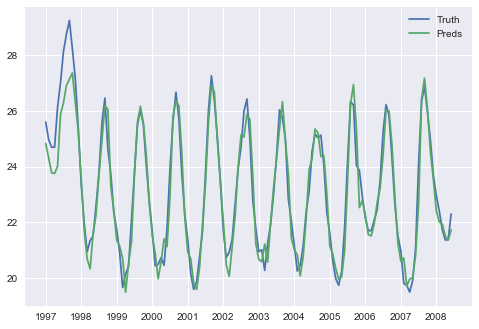

Test MRSE: 0.27381008506572796
Test RE: 0.026984040590905506
Test ERROR: 0.6293082557621951


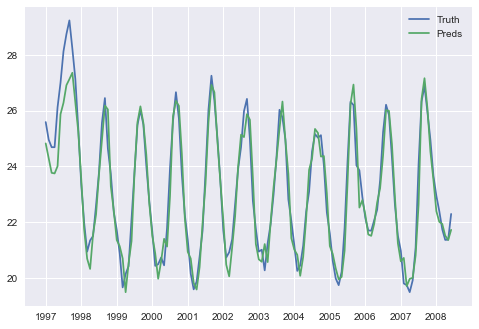

Test MRSE: 0.2736713543758186
Test RE: 0.026970368652682992
Test ERROR: 0.6289894056786905
epoch:  71 loss: 172.38572808


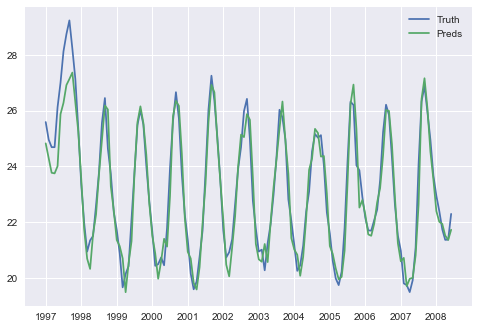

Test MRSE: 0.27352122023731806
Test RE: 0.02695557290224011
Test ERROR: 0.6286443466104411


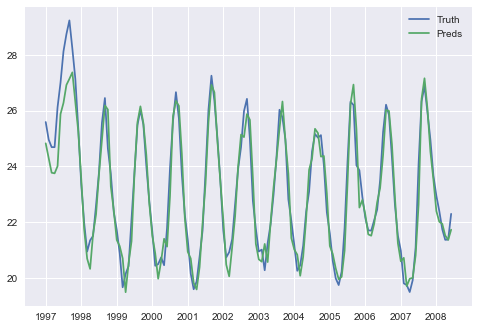

Test MRSE: 0.27336216725568546
Test RE: 0.026939898197959406
Test ERROR: 0.6282787890217899


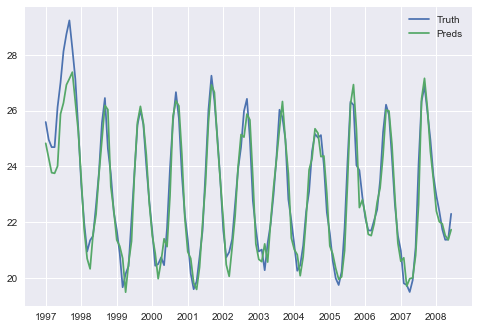

Test MRSE: 0.27319859672510355
Test RE: 0.02692377828829414
Test ERROR: 0.627902848576536


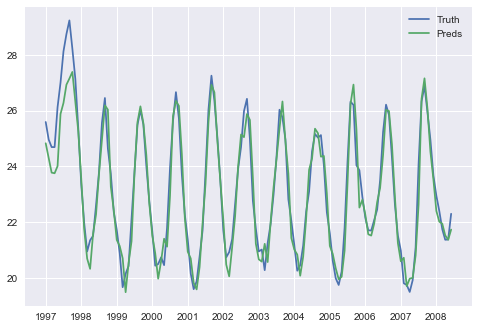

Test MRSE: 0.2730338823790281
Test RE: 0.026907545655375096
Test ERROR: 0.6275242792561151


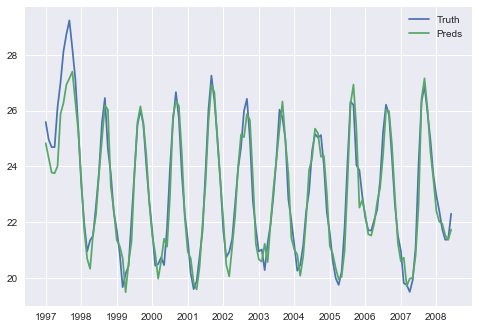

Test MRSE: 0.27287084711943715
Test RE: 0.02689147849677685
Test ERROR: 0.627149569044779
epoch:  76 loss: 171.04580722


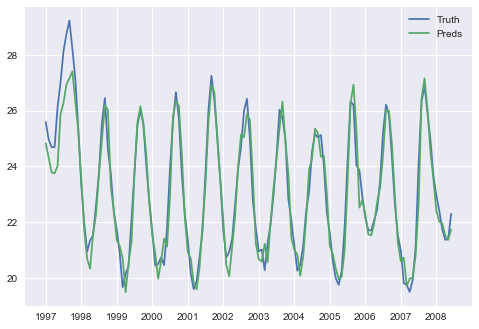

Test MRSE: 0.27271157870524376
Test RE: 0.026875782561572664
Test ERROR: 0.6267835163191828


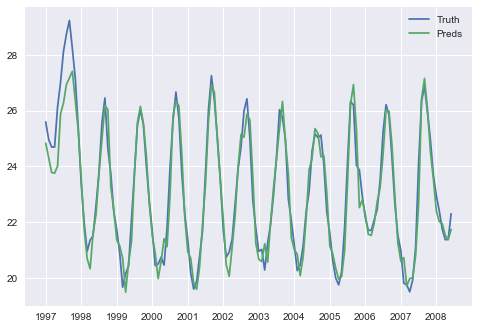

Test MRSE: 0.27255710038432485
Test RE: 0.02686055869105274
Test ERROR: 0.6264284728493003


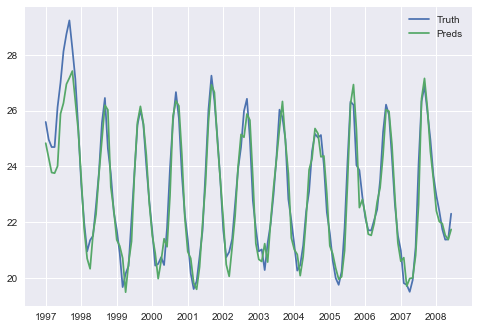

Test MRSE: 0.27240818593273824
Test RE: 0.026845883141007817
Test ERROR: 0.6260862170344231


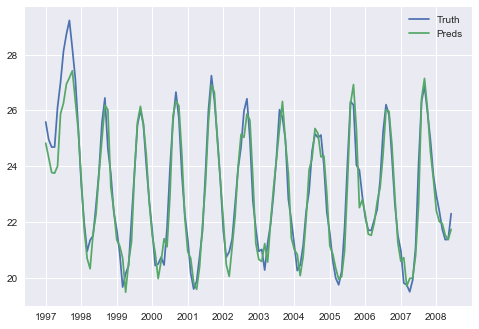

Test MRSE: 0.27226466548104894
Test RE: 0.02683173917076991
Test ERROR: 0.6257563584570915


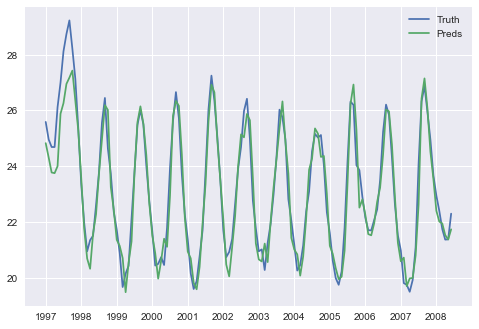

Test MRSE: 0.2721273088745545
Test RE: 0.026818202648752523
Test ERROR: 0.6254406664823798
epoch:  81 loss: 169.88946032


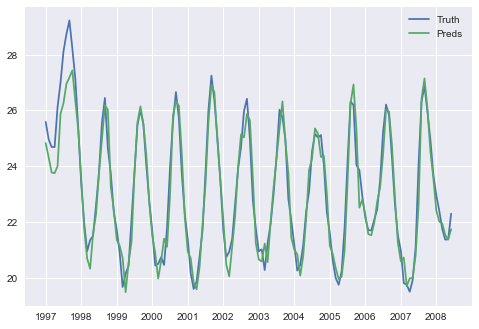

Test MRSE: 0.27199563953790745
Test RE: 0.02680522660835646
Test ERROR: 0.6251380457788259


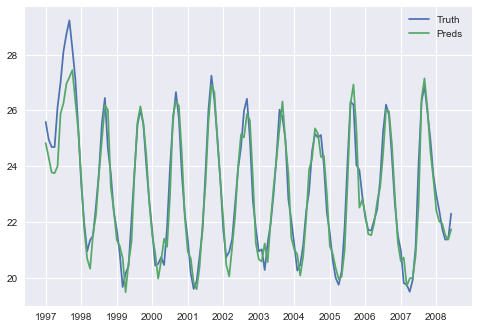

Test MRSE: 0.2718699653512673
Test RE: 0.02679284139123521
Test ERROR: 0.6248492039592491


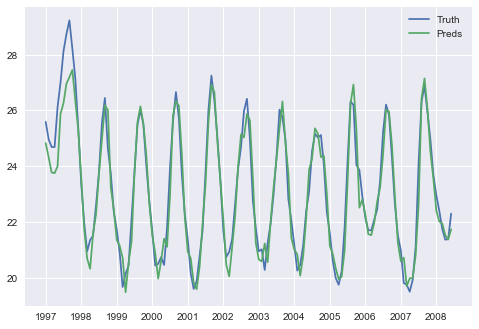

Test MRSE: 0.2717499945739157
Test RE: 0.02678101824628056
Test ERROR: 0.6245734705047293


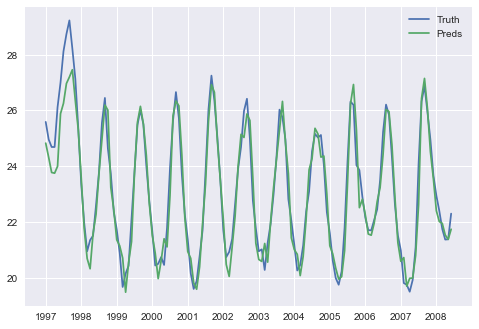

Test MRSE: 0.27163571672870684
Test RE: 0.026769756140967615
Test ERROR: 0.6243108213352387


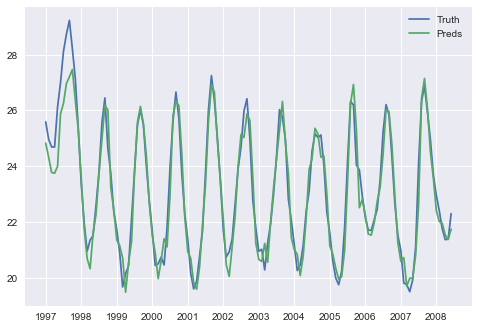

Test MRSE: 0.27152692187282806
Test RE: 0.0267590343853887
Test ERROR: 0.6240607739311318
epoch:  86 loss: 168.84331732


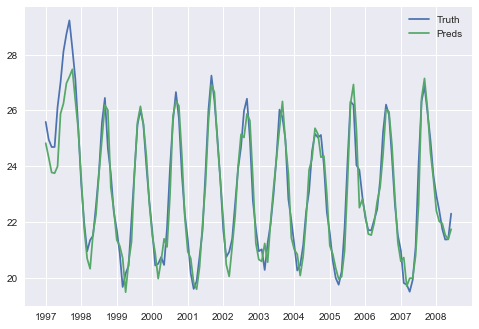

Test MRSE: 0.2714237787719204
Test RE: 0.02674886961143271
Test ERROR: 0.623823716172976


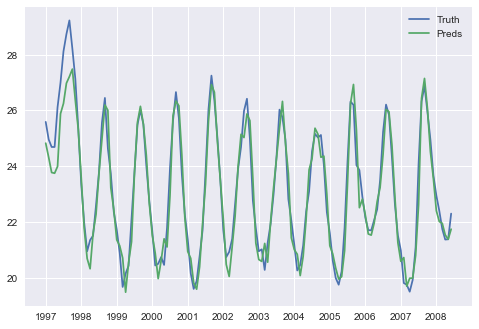

Test MRSE: 0.27132590274210017
Test RE: 0.026739223908423225
Test ERROR: 0.6235987639269975


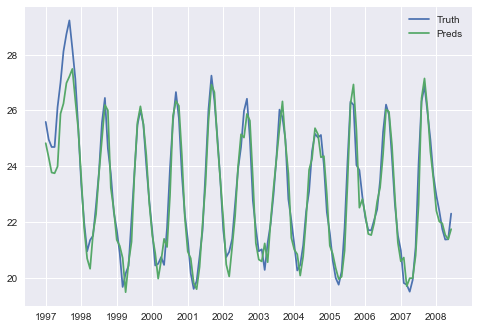

Test MRSE: 0.2712332188723614
Test RE: 0.0267300898938651
Test ERROR: 0.6233857450223486


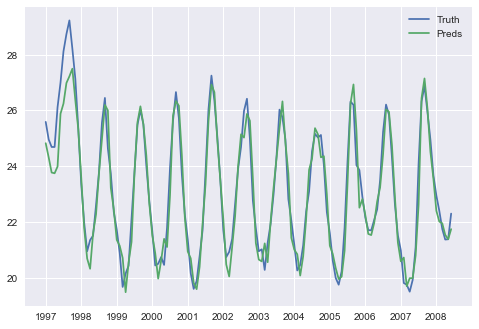

Test MRSE: 0.2711456194376145
Test RE: 0.026721456951428434
Test ERROR: 0.6231844118703096


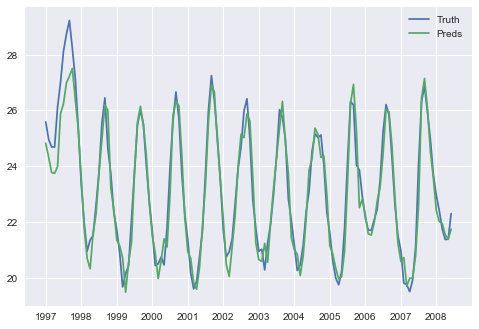

Test MRSE: 0.27106351715496463
Test RE: 0.026713365754469424
Test ERROR: 0.6229957130344866
epoch:  91 loss: 167.87758188


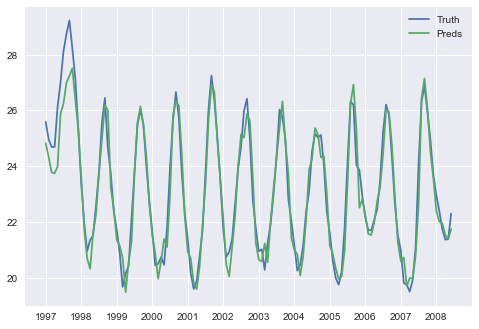

Test MRSE: 0.27098680123329666
Test RE: 0.026705805384500726
Test ERROR: 0.6228193938793961


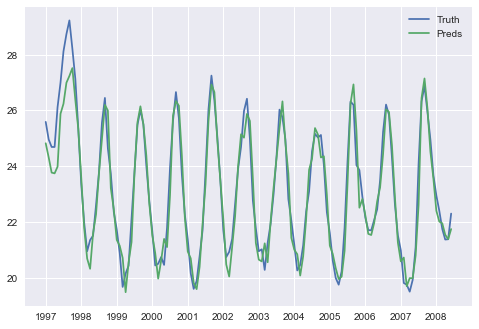

Test MRSE: 0.2709150424772076
Test RE: 0.02669873354422649
Test ERROR: 0.6226544679687263


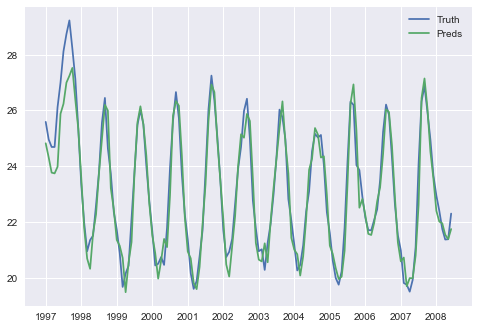

Test MRSE: 0.2708495271085875
Test RE: 0.02669227699108036
Test ERROR: 0.6225038914757456


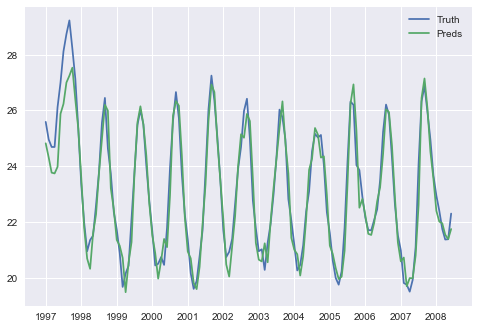

Test MRSE: 0.27078965677812733
Test RE: 0.02668637675761401
Test ERROR: 0.6223662891912104


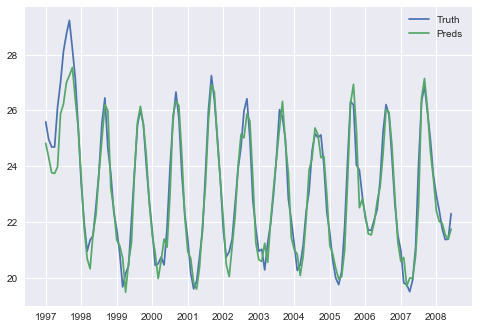

Test MRSE: 0.270736886208696
Test RE: 0.02668117620706746
Test ERROR: 0.6222450045606738
epoch:  96 loss: 166.96810937


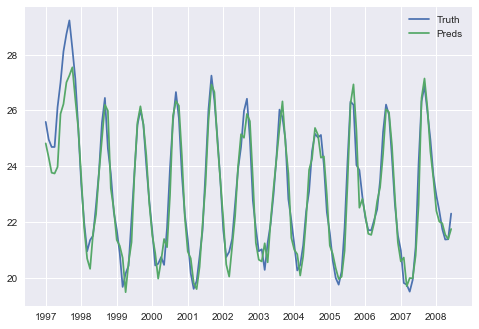

Test MRSE: 0.2706912609050639
Test RE: 0.026676679823945247
Test ERROR: 0.6221401421695005


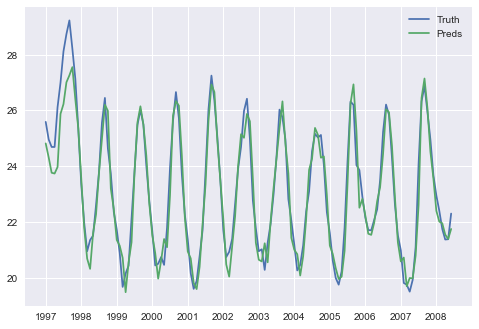

Test MRSE: 0.27065484572949555
Test RE: 0.026673091100851188
Test ERROR: 0.6220564477700969


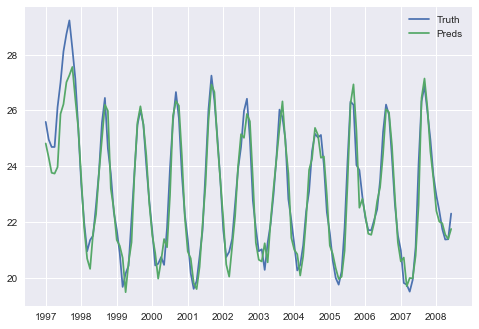

Test MRSE: 0.2706287448753267
Test RE: 0.026670518856267207
Test ERROR: 0.6219964591725005


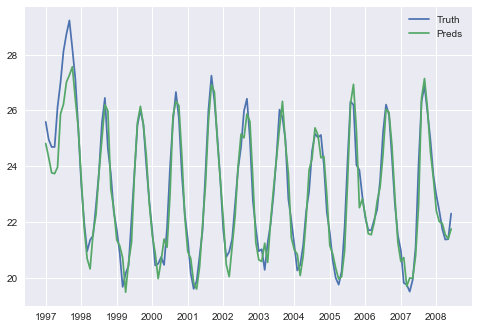

Test MRSE: 0.2706140287479165
Test RE: 0.02666906857886314
Test ERROR: 0.621962636530541


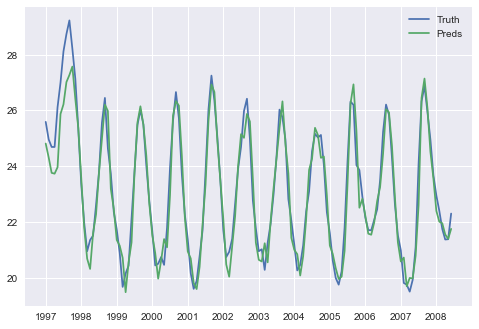

Test MRSE: 0.2706103670036442
Test RE: 0.026668707713206737
Test ERROR: 0.6219542206027621
epoch: 101 loss: 166.05844832


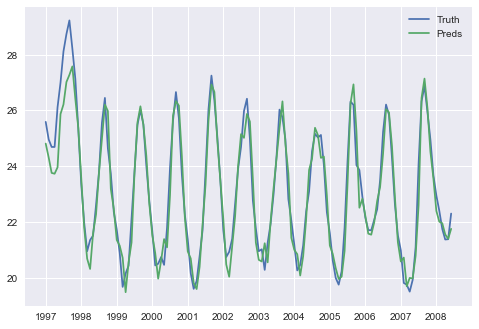

Test MRSE: 0.27061461195336317
Test RE: 0.026669126053880693
Test ERROR: 0.6219639769340629


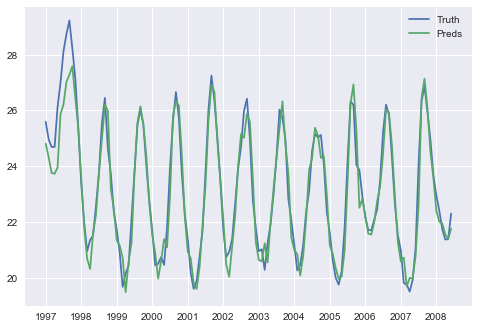

Test MRSE: 0.27061943673306066
Test RE: 0.026669601536919118
Test ERROR: 0.6219750659109176


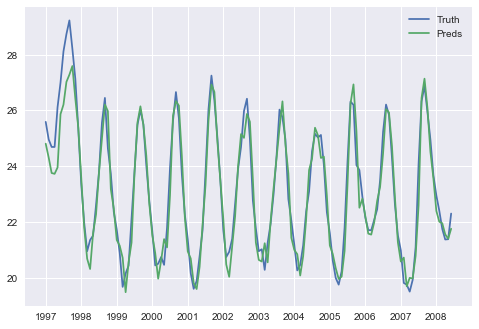

Test MRSE: 0.27061902931991366
Test RE: 0.026669561386269105
Test ERROR: 0.621974129537603


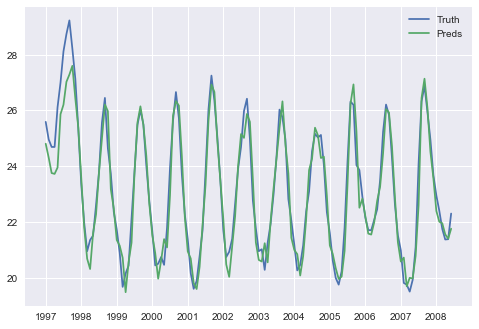

Test MRSE: 0.27060996989330965
Test RE: 0.026668668577901018
Test ERROR: 0.6219533079087978
Epoch   105: reducing learning rate of group 0 to 1.0000e-05.


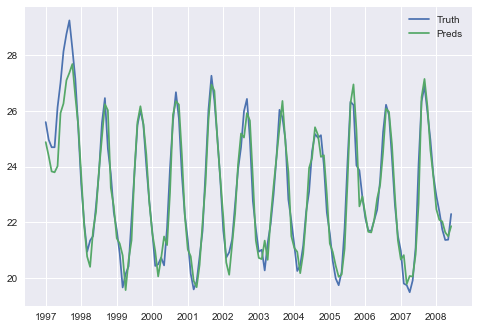

Test MRSE: 0.2645322495168706
Test RE: 0.02606970797607134
Test ERROR: 0.6079846492737842
epoch: 106 loss: 156.27071201


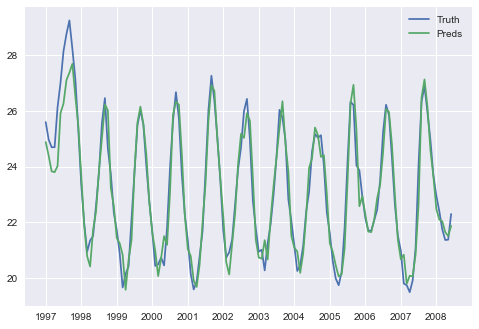

Test MRSE: 0.2643769361113711
Test RE: 0.026054401807793042
Test ERROR: 0.6076276864968728


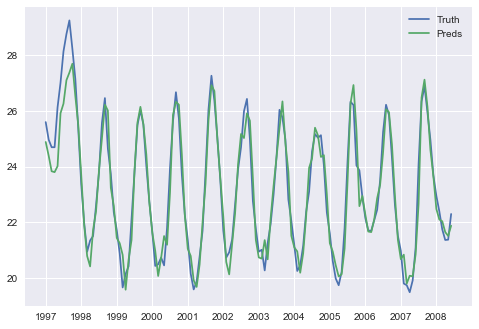

Test MRSE: 0.2643861203327269
Test RE: 0.026055306914709763
Test ERROR: 0.6076487949462587


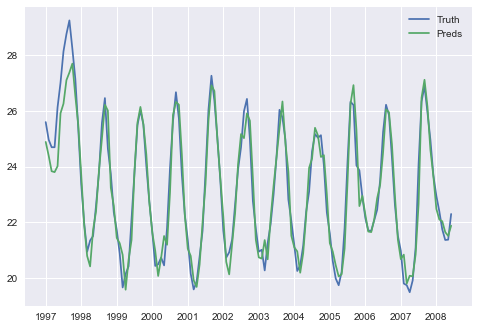

Test MRSE: 0.26437250876200585
Test RE: 0.02605396549159617
Test ERROR: 0.6076175109494455


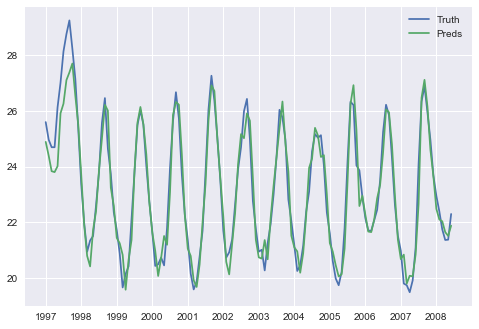

Test MRSE: 0.2643486155495703
Test RE: 0.026051610810562217
Test ERROR: 0.6075625962598028


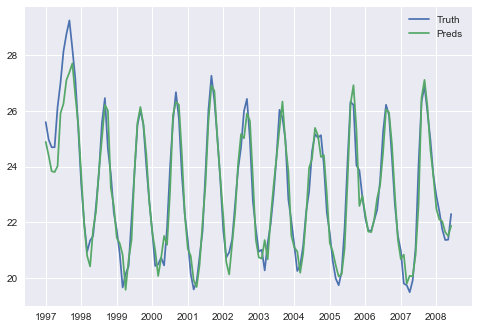

Test MRSE: 0.2643251904635767
Test RE: 0.02604930226348608
Test ERROR: 0.6075087574831772
epoch: 111 loss: 155.65559151


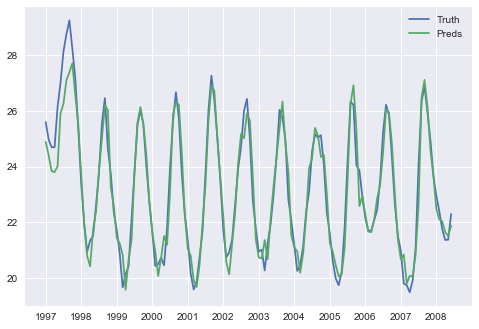

Test MRSE: 0.26430448876276463
Test RE: 0.0260472621065836
Test ERROR: 0.6074611779675204


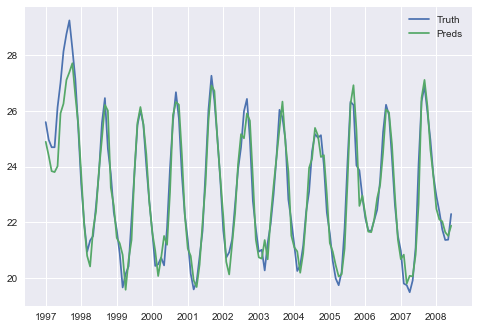

Test MRSE: 0.26428731944311457
Test RE: 0.026045570066576224
Test ERROR: 0.6074217170594278


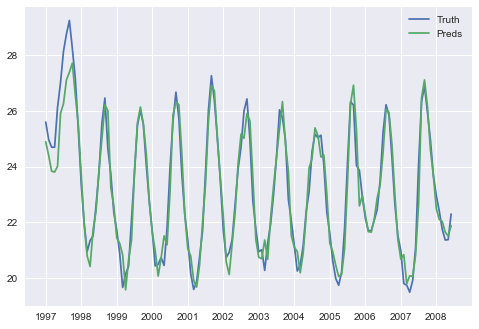

Test MRSE: 0.26427304543002134
Test RE: 0.026044163359629655
Test ERROR: 0.6073889105458173


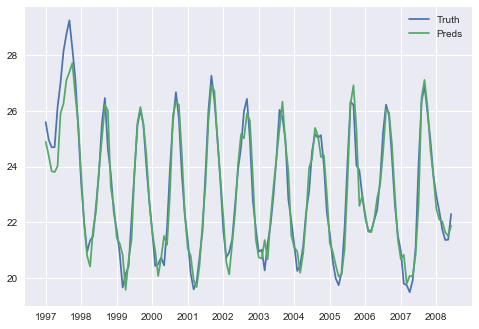

Test MRSE: 0.26426108761058037
Test RE: 0.02604298491404721
Test ERROR: 0.6073614274292136


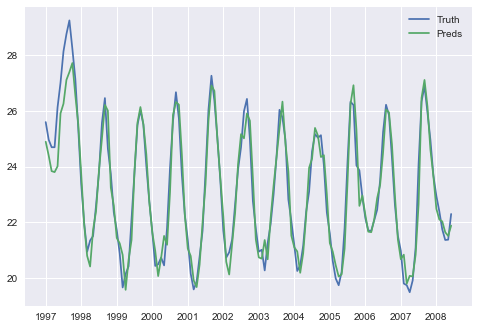

Test MRSE: 0.26425062722310455
Test RE: 0.026041954040695058
Test ERROR: 0.6073373859181224
epoch: 116 loss: 155.42946804


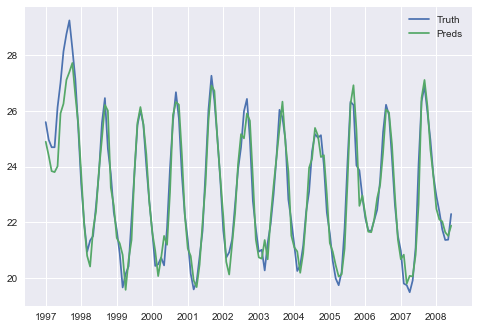

Test MRSE: 0.26424160789052065
Test RE: 0.02604106518360096
Test ERROR: 0.6073166564389464


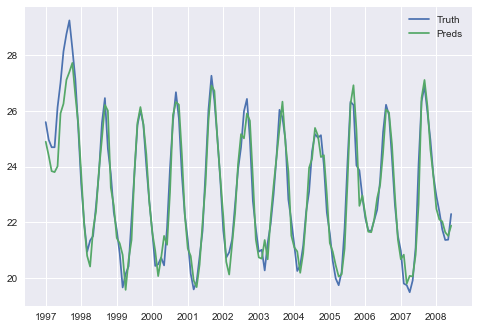

Test MRSE: 0.2642335027734897
Test RE: 0.026040266422638944
Test ERROR: 0.6072980281365585


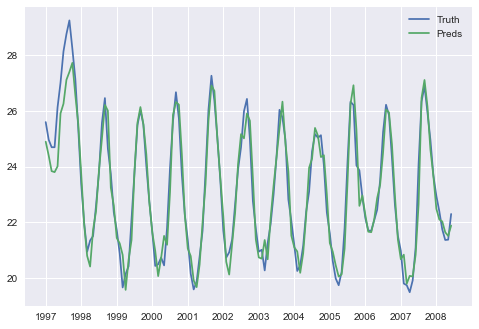

Test MRSE: 0.26422598628603866
Test RE: 0.026039525671243933
Test ERROR: 0.6072807527041866


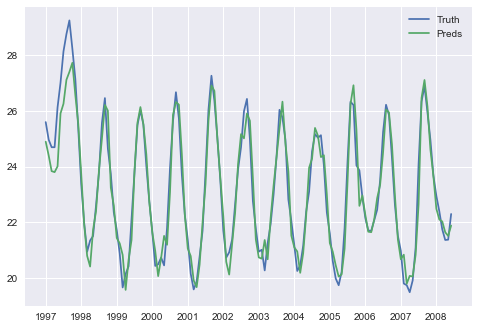

Test MRSE: 0.26421885537514334
Test RE: 0.026038822918498346
Test ERROR: 0.6072643634572513


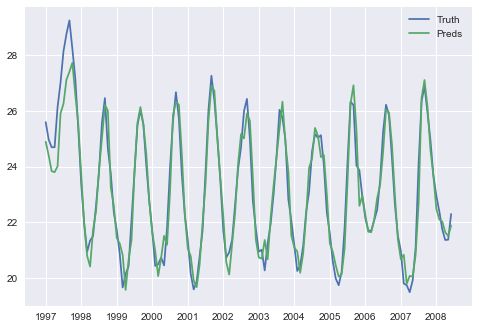

Test MRSE: 0.26421178394150363
Test RE: 0.026038126027248622
Test ERROR: 0.6072481109091815
epoch: 121 loss: 155.24780841


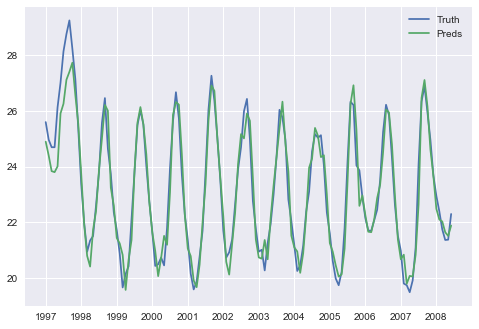

Test MRSE: 0.2642050064809326
Test RE: 0.02603745810710569
Test ERROR: 0.6072325340107285


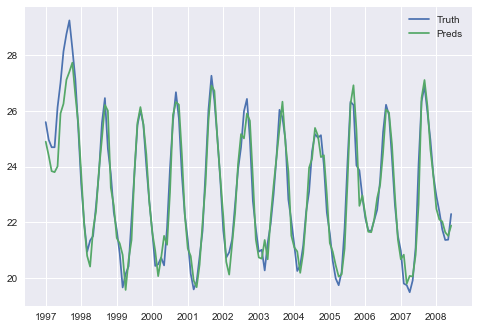

Test MRSE: 0.26419815122139356
Test RE: 0.026036782519858352
Test ERROR: 0.6072167783039134


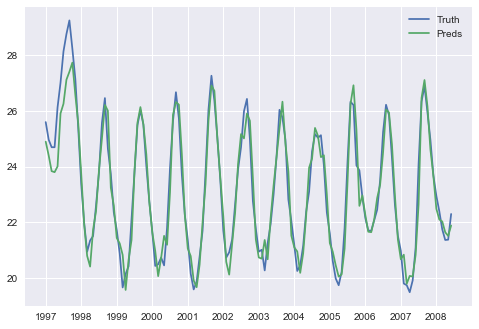

Test MRSE: 0.26419142358233144
Test RE: 0.02603611950963545
Test ERROR: 0.6072013159121518


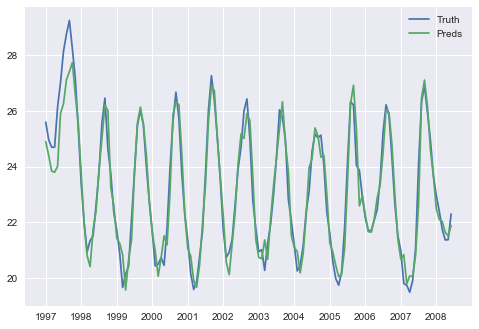

Test MRSE: 0.26418470090547186
Test RE: 0.02603545698843863
Test ERROR: 0.6071858649252111


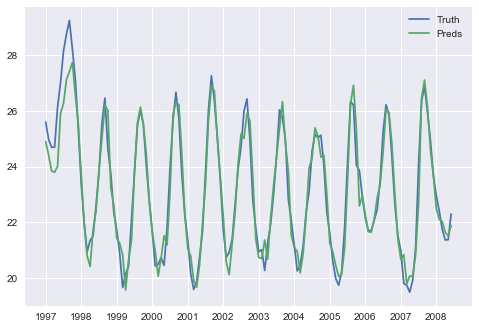

Test MRSE: 0.26417784805981726
Test RE: 0.026034781639080108
Test ERROR: 0.6071701147663197
epoch: 126 loss: 155.08671451


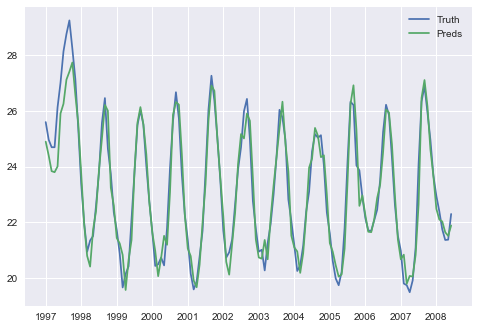

Test MRSE: 0.26417108679940293
Test RE: 0.026034115315465976
Test ERROR: 0.6071545751013103


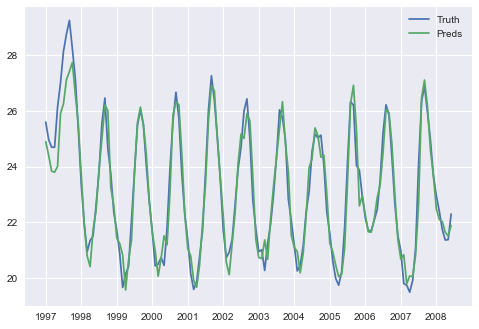

Test MRSE: 0.26416402087046414
Test RE: 0.026033418966705663
Test ERROR: 0.6071383352049063


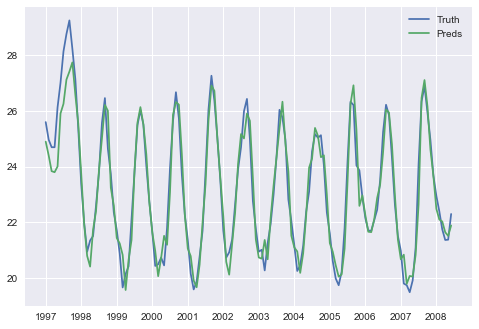

Test MRSE: 0.264156862903825
Test RE: 0.02603271354761092
Test ERROR: 0.6071218837747138


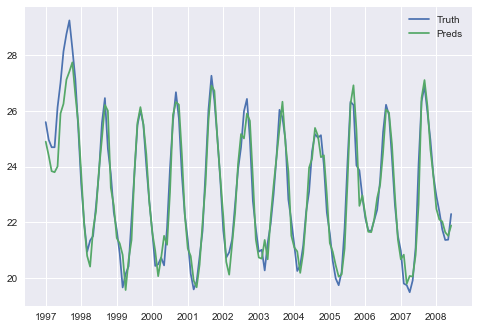

Test MRSE: 0.264149511813781
Test RE: 0.026031989096164627
Test ERROR: 0.6071049884815677


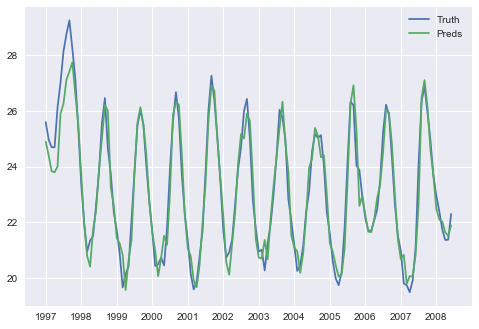

Test MRSE: 0.2641424377496159
Test RE: 0.026031291945676074
Test ERROR: 0.60708872988766
epoch: 131 loss: 154.93842898


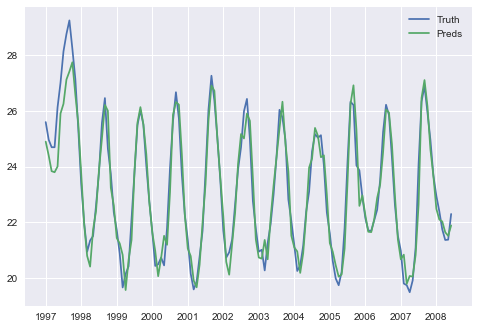

Test MRSE: 0.2641352098762334
Test RE: 0.0260305796372573
Test ERROR: 0.6070721177881091


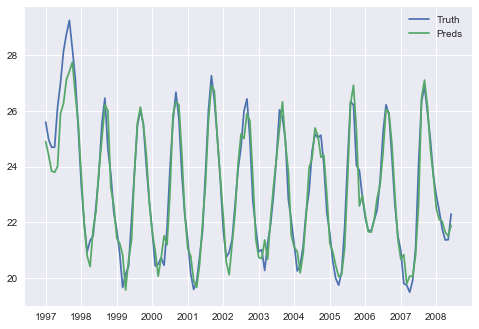

Test MRSE: 0.26412784444969056
Test RE: 0.026029853772946077
Test ERROR: 0.6070551895448358


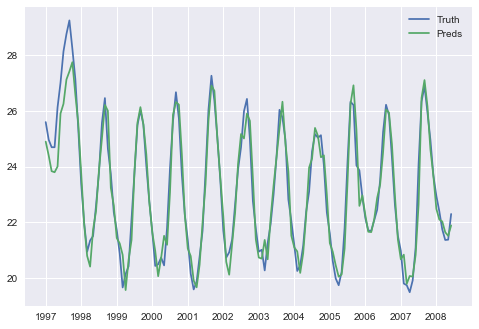

Test MRSE: 0.2641204704345547
Test RE: 0.026029127062227236
Test ERROR: 0.607038241562069


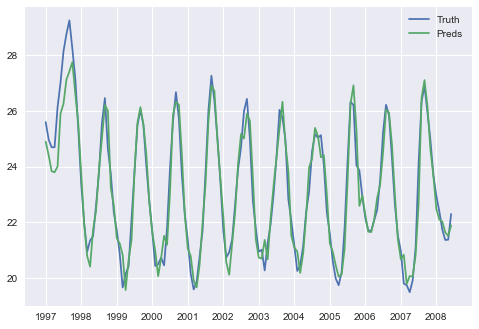

Test MRSE: 0.26411301903472534
Test RE: 0.026028392725230828
Test ERROR: 0.6070211157230829


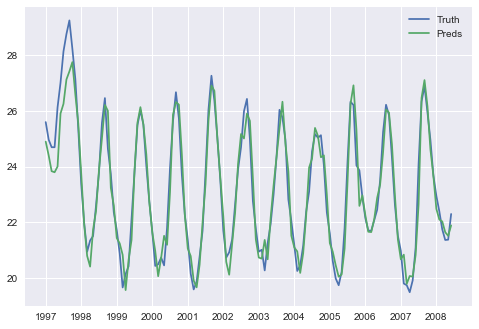

Test MRSE: 0.2641054639298079
Test RE: 0.026027648168076505
Test ERROR: 0.6070037515347019
epoch: 136 loss: 154.79944330


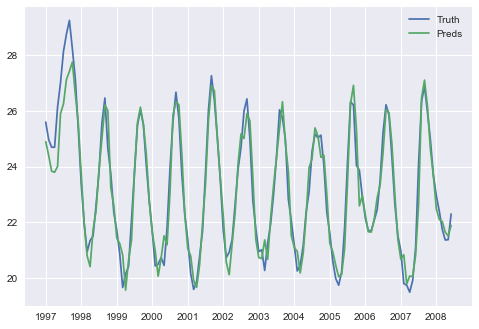

Test MRSE: 0.2640981537765923
Test RE: 0.02602692775096313
Test ERROR: 0.6069869503282439


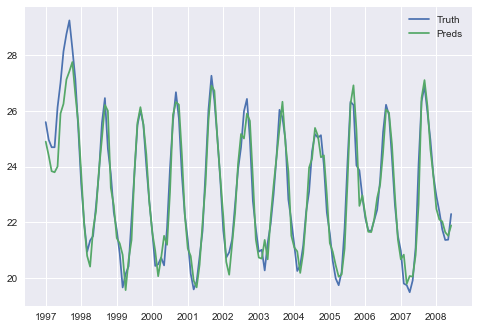

Test MRSE: 0.2640907434898196
Test RE: 0.026026197465666968
Test ERROR: 0.6069699189809781


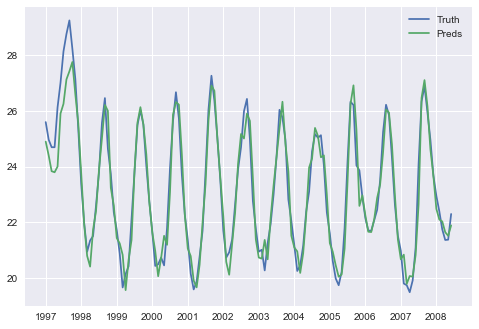

Test MRSE: 0.2640833706386368
Test RE: 0.026025470869655943
Test ERROR: 0.6069529736733693


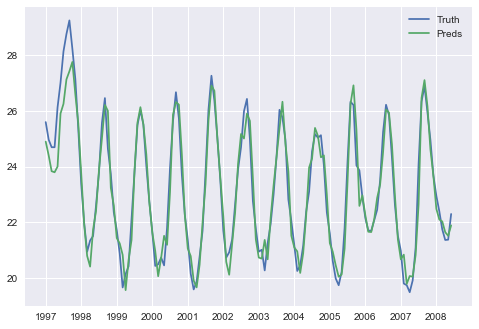

Test MRSE: 0.2640757923148116
Test RE: 0.026024724024273454
Test ERROR: 0.6069355561200791


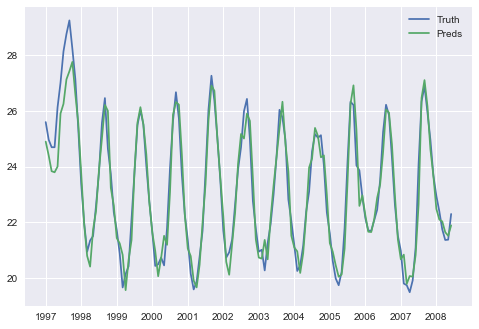

Test MRSE: 0.26406829683329364
Test RE: 0.0260239853430175
Test ERROR: 0.6069183289664517
epoch: 141 loss: 154.66768210


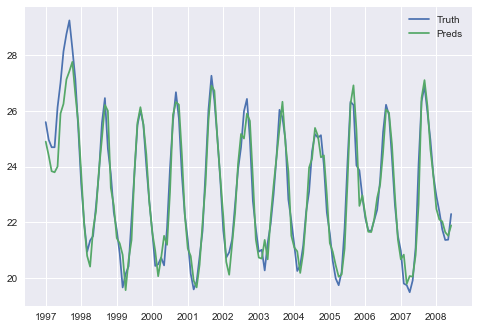

Test MRSE: 0.26406074793390955
Test RE: 0.026023241397419777
Test ERROR: 0.6069009790404868


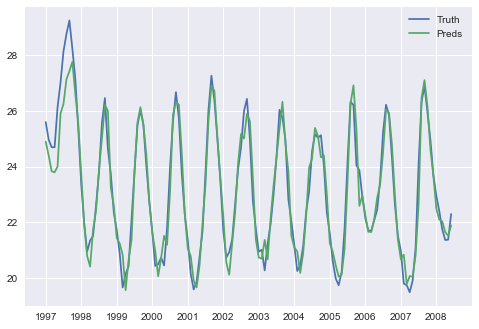

Test MRSE: 0.2640531508889289
Test RE: 0.02602249270706354
Test ERROR: 0.6068835184596445


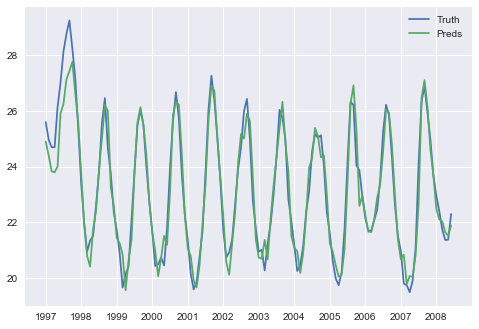

Test MRSE: 0.2640459553722084
Test RE: 0.0260217835874005
Test ERROR: 0.6068669807266549


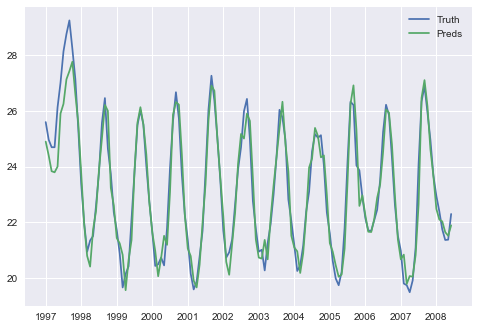

Test MRSE: 0.26403835017551824
Test RE: 0.026021034093691605
Test ERROR: 0.6068495014104249


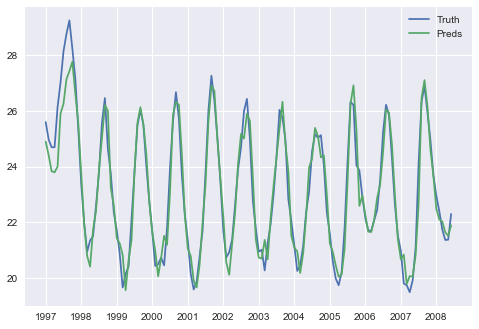

Test MRSE: 0.2640310327829197
Test RE: 0.026020312963135544
Test ERROR: 0.6068326835654145
epoch: 146 loss: 154.54161202


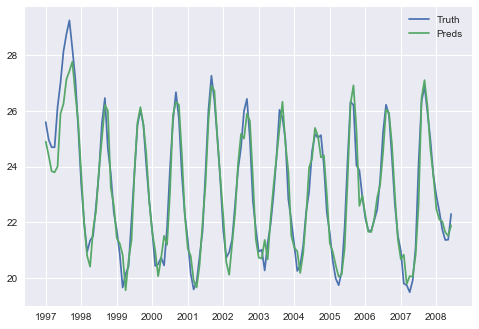

Test MRSE: 0.2640235248962881
Test RE: 0.026019573059353075
Test ERROR: 0.6068154279006371


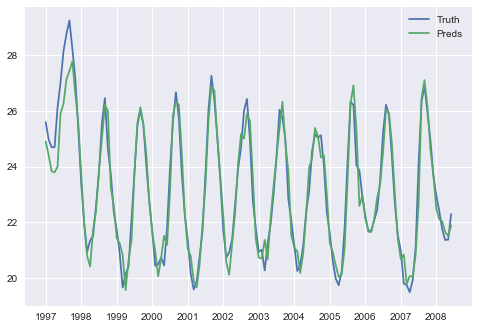

Test MRSE: 0.2640164333227061
Test RE: 0.02601887418330786
Test ERROR: 0.6067991290641627


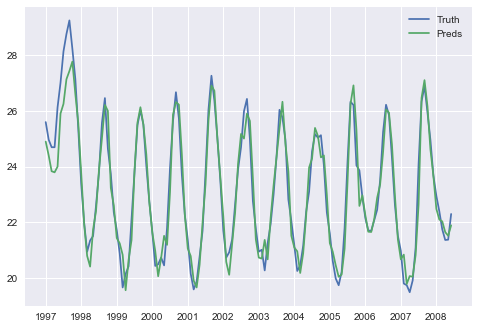

Test MRSE: 0.26400915620734394
Test RE: 0.026018157022081788
Test ERROR: 0.6067824037898748


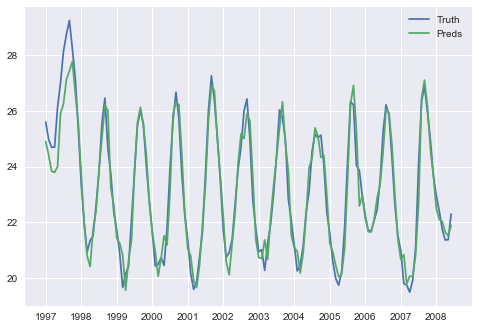

Test MRSE: 0.2640019854788698
Test RE: 0.026017450345305563
Test ERROR: 0.6067659230286657


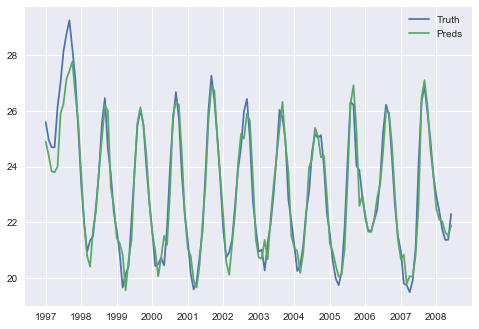

Test MRSE: 0.2639948662632771
Test RE: 0.02601674874513447
Test ERROR: 0.6067495606614945
epoch: 151 loss: 154.42043310


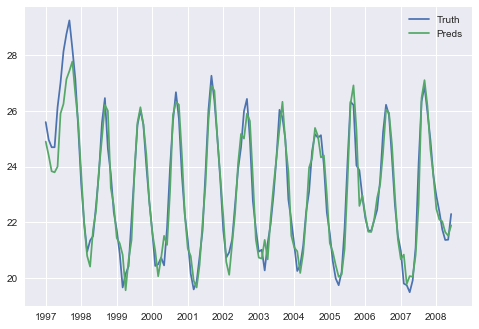

Test MRSE: 0.2639879981441995
Test RE: 0.02601607189057694
Test ERROR: 0.6067337753991069


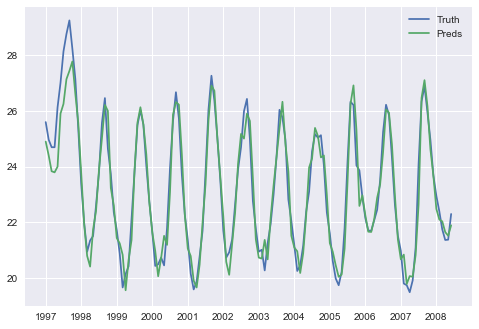

Test MRSE: 0.2639809403389922
Test RE: 0.026015376342412053
Test ERROR: 0.6067175541737878


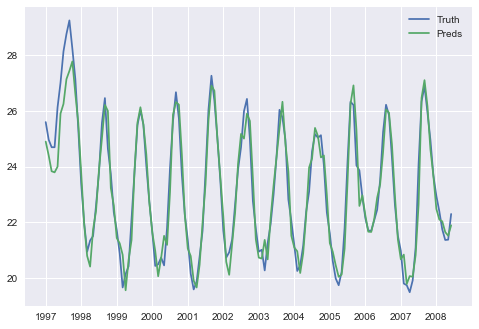

Test MRSE: 0.26397395971639553
Test RE: 0.02601468840060942
Test ERROR: 0.6067015103402329


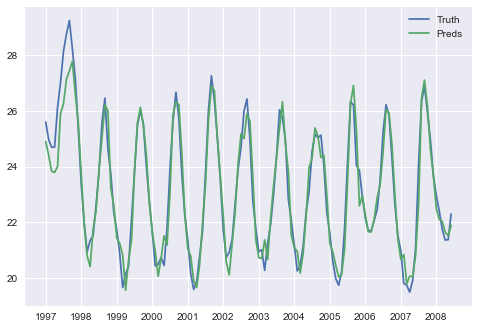

Test MRSE: 0.2639670995623919
Test RE: 0.026014012331011586
Test ERROR: 0.6066857433842815


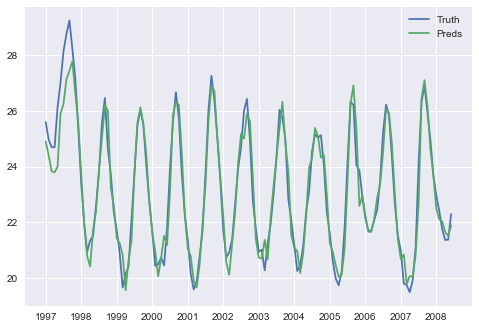

Test MRSE: 0.2639604287174586
Test RE: 0.02601335491786184
Test ERROR: 0.6066704115246518
epoch: 156 loss: 154.30296064


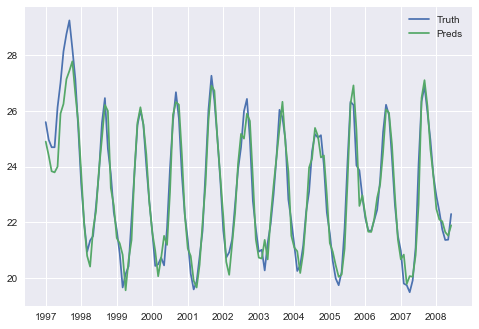

Test MRSE: 0.2639535954238857
Test RE: 0.026012681495365012
Test ERROR: 0.6066547063030621


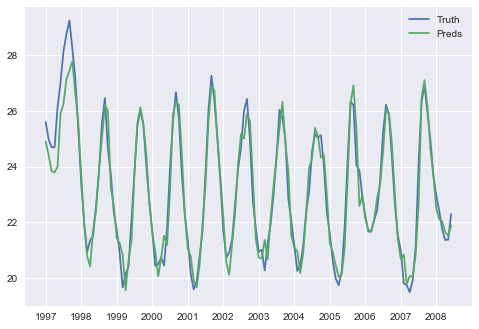

Test MRSE: 0.26394726065119184
Test RE: 0.026012057202204064
Test ERROR: 0.6066401468511935


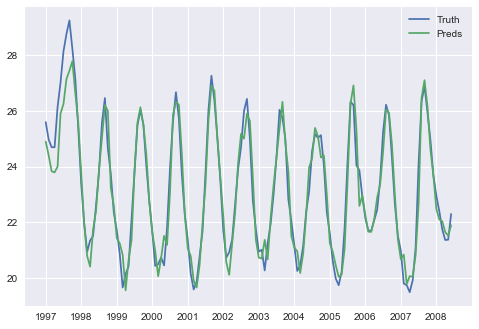

Test MRSE: 0.2639407879028543
Test RE: 0.026011419311514856
Test ERROR: 0.6066252702845933


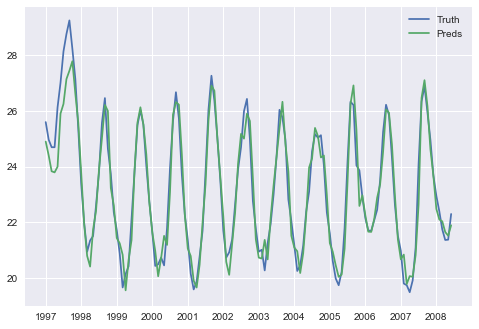

Test MRSE: 0.2639341970042283
Test RE: 0.02601076977709025
Test ERROR: 0.6066101221686383


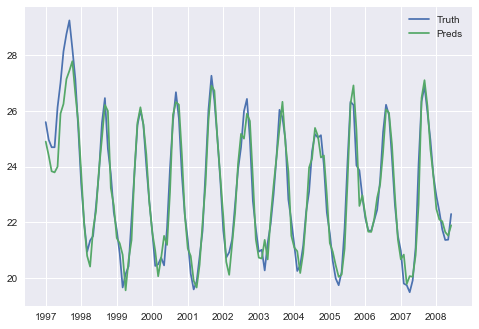

Test MRSE: 0.2639277389649513
Test RE: 0.026010133335982004
Test ERROR: 0.6065952794084379
epoch: 161 loss: 154.18914075


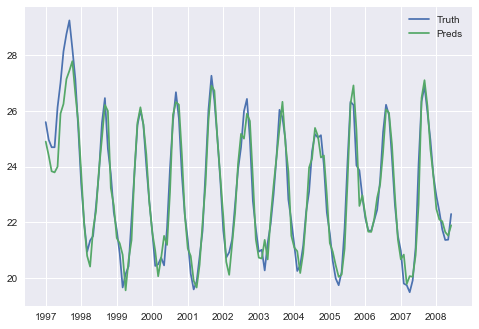

Test MRSE: 0.2639213475106681
Test RE: 0.026009503456838685
Test ERROR: 0.6065805896830914


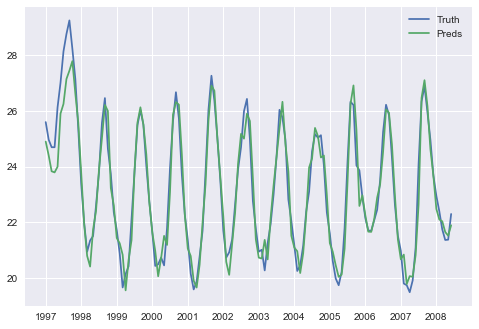

Test MRSE: 0.2639153945950351
Test RE: 0.02600891679577017
Test ERROR: 0.6065669078680012


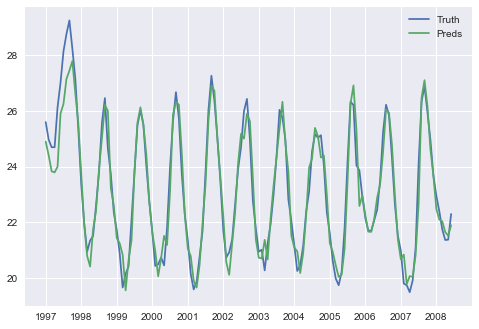

Test MRSE: 0.26390916154128663
Test RE: 0.026008302527032356
Test ERROR: 0.6065525822006994


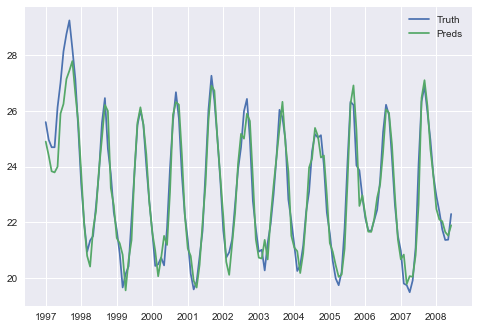

Test MRSE: 0.2639030065283244
Test RE: 0.026007695949230185
Test ERROR: 0.6065384358975399


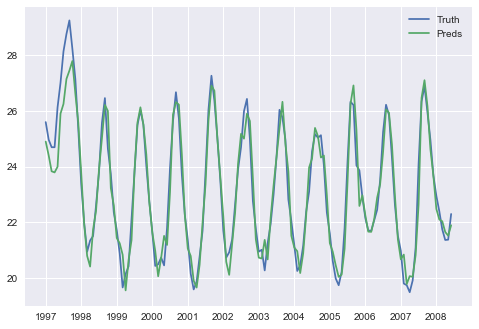

Test MRSE: 0.2638970808542011
Test RE: 0.026007111972818096
Test ERROR: 0.6065248166926599
epoch: 166 loss: 154.07854445


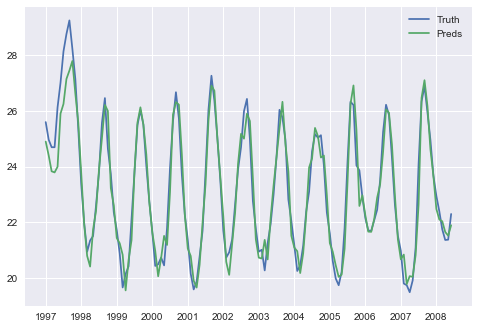

Test MRSE: 0.26389106433016624
Test RE: 0.026006519043128402
Test ERROR: 0.6065109886839318


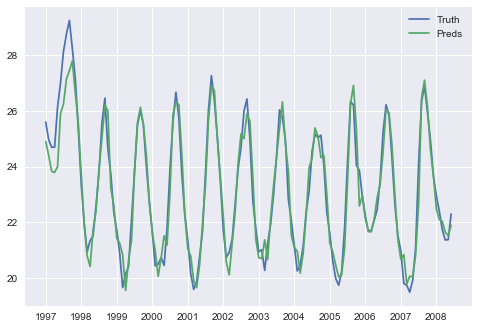

Test MRSE: 0.263885211635522
Test RE: 0.026005942258859084
Test ERROR: 0.6064975372105968


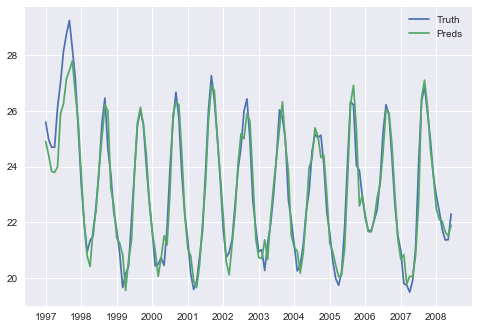

Test MRSE: 0.2638794405168184
Test RE: 0.026005373513915613
Test ERROR: 0.6064842732263858


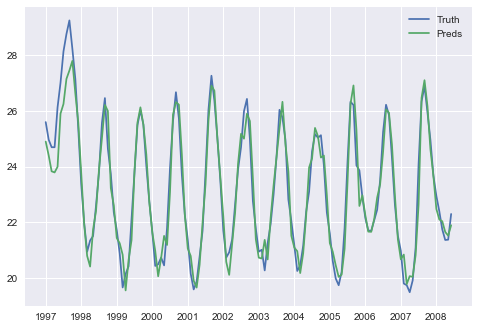

Test MRSE: 0.26387373999932734
Test RE: 0.02600481172673626
Test ERROR: 0.6064711715076585


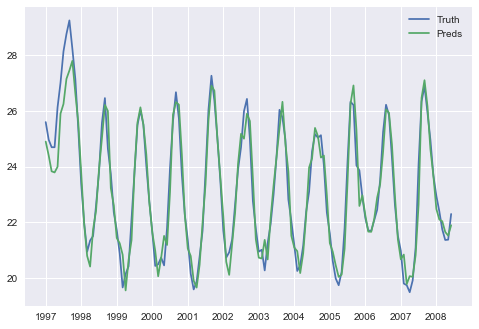

Test MRSE: 0.2638681464037031
Test RE: 0.02600426047672902
Test ERROR: 0.6064583155315723
epoch: 171 loss: 153.97068678


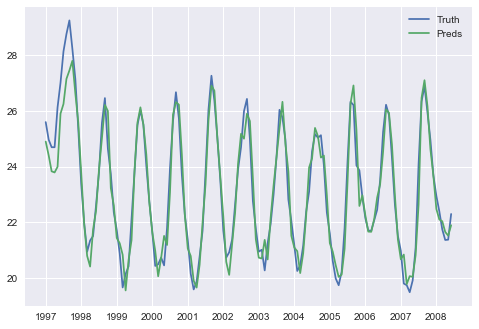

Test MRSE: 0.2638626464772323
Test RE: 0.026003718457836257
Test ERROR: 0.6064456748389063


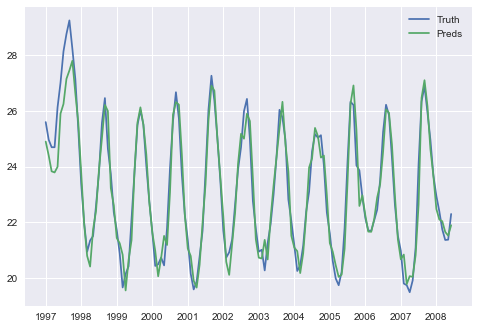

Test MRSE: 0.2638571713767727
Test RE: 0.026003178885552043
Test ERROR: 0.6064330912048175


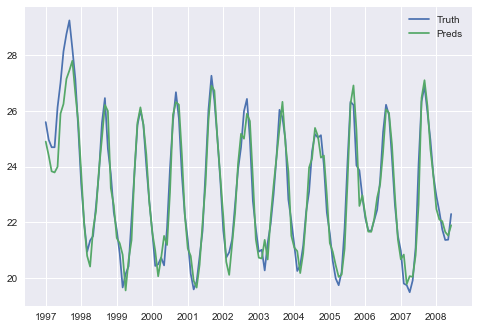

Test MRSE: 0.2638518440086851
Test RE: 0.02600265387232368
Test ERROR: 0.6064208471097243


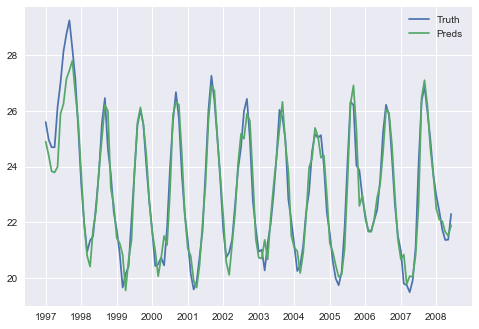

Test MRSE: 0.26384675811531866
Test RE: 0.026002152656479094
Test ERROR: 0.6064091580052755


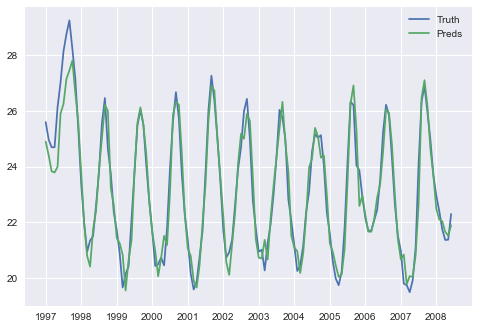

Test MRSE: 0.26384149958377906
Test RE: 0.026001634427106797
Test ERROR: 0.6063970721198698
epoch: 176 loss: 153.86526690


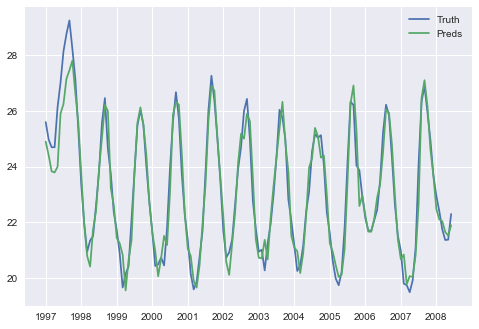

Test MRSE: 0.26383647139894584
Test RE: 0.026001138898450113
Test ERROR: 0.6063855156491638
Epoch   177: reducing learning rate of group 0 to 1.0000e-06.
LR lower than threshold {lr_threshold}. stopping training
epoch: 178 loss: 0.0049374122


In [24]:
layers = [1]
sizes = [128]
epochs = 200
p=6
loss_function = nn.MSELoss()
input_size=1
output_size=1
skip_cnt = 0
lr_threshold = 1e-5
best_test_metric = np.inf
best_path = None
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
def error(actuals, preds):
    actuals = np.array(actuals)
    preds = np.array(preds)
    return np.sqrt(np.mean(np.square(actuals-preds)))


for a,l in enumerate(layers):
    for b,s in enumerate(sizes):
        if (a*len(sizes))+(b)<skip_cnt:
            print(f'Skipping num_hidden_layers: {l} hidden_layer_size: {s}')
        else:
            num_hidden_layers=l
            hidden_layer_size=s
            prev_running_loss = np.inf
            model = LSTM(input_size,hidden_layer_size,num_hidden_layers,output_size)
            print(model)
            optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
            scheduler = ReduceLROnPlateau(optimizer, 'min', verbose=True, patience=4)
            #best_model_params = model.state_dict()
            #PATH = f'models/best_rnn_model_{p}_{l}_{s}.pth'

            for i in range(epochs):
                running_loss = 0.0
                cnt=0
                for seq, labels in train_inout_seq:
                    optimizer.zero_grad()
            #         model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
            #                         torch.zeros(1, 1, model.hidden_layer_size))

                    y_pred = model(seq)
                    single_loss = loss_function(y_pred, labels)
                    single_loss.backward()
                    optimizer.step()
                    current_loss = single_loss.item()
                    running_loss += current_loss
                current_lr = get_lr(optimizer)
                if current_lr < lr_threshold:
                    print('LR lower than threshold {lr_threshold}. stopping training')
                    break
                    
#                 if running_loss > prev_running_loss:
#                     print('Training loss started to increase. stopping training...')
#                     prev_running_loss = running_loss
#                     cnt += 1
#                     if cnt > 4:   
#                         break
#                 else:
#                     cnt=0
                prev_running_loss = running_loss
                test_mrse,test_re,test_error,_,_ = evaluate(False,True)
                
                if i%5 == 1:
                    print(f'epoch: {i:3} loss: {running_loss:10.8f}')
                test_metric = test_error 
                scheduler.step(test_metric)
                if(test_metric < best_test_metric):
                    count = 0
                    best_test_metric = test_metric
                    #best_path = PATH
                    #torch.save({
                    #    'state_dict': model.state_dict(),
                    #    }, PATH)
                    #print(f"Best Model saved at epoch: {i} with metric: {best_test_metric} num_hidden_layers: {l} hidden_layer_size: {s}")
                else:
                    count+=1
            #     if(count >= 5):
            #         print("Validation has not improved since 5 epochs. Early Stopping...")
            #         break
            print(f'epoch: {i:3} loss: {single_loss.item():10.10f}')

In [26]:
#took 2 minutes to get to 0.387 mrse